# Annotation of stripe identity of trunk lateral ectoderm

In [1]:
#loading packages
library(Seurat)
library(ggplot2)
library(magrittr)
library(data.table)
library(Matrix)
library(dplyr)
library(tibble)
library(Rtsne)
library(ClusterR)
library(corrr)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:data.table’:

    between, first, last


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: gtools



In [2]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] corrr_0.4.3       ClusterR_1.2.2    gtools_3.8.2      Rtsne_0.15       
 [5] tibble_3.0.5      dplyr_1.0.3       Matrix_1.3-2      data.table_1.13.6
 [9] magrittr_2.0.1    ggplot2_3.3.3     Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] nlme_3.1-151          matrixStats_0.57.0    RcppAnnoy_0.0.18     
  [4] RColorBrewer_1.1-2    httr_1.4.2            repr_1.1.0           
  [7] sctransform_0.3.2     tools_4.0.3           R6_2.5.1             
 [10] irlba_2.3.3        

In [3]:
#loading data
seu_HQC <- readRDS(file = "../../data/seurat_object/Set3/seu_HQC_subclusterd2_Set3.obj")

In [4]:
seu_HQC

An object of class Seurat 
28745 features across 6118 samples within 2 assays 
Active assay: SCT (11239 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

## Pick up trunk lateral ectoderm

In [5]:
seu_HQC_lateralect <- subset(seu_HQC, 
                             ident = c("ectoderm_intermediate_DE_abdominal_even", "ectoderm_intermediate_DE_abdominal_odd", "ectoderm_intermediate_DE_PS13",
 "ectoderm_intermediate_NE_abdominal_even", "ectoderm_intermediate_NE_abdominal_odd", "ectoderm_intermediate_NE_PS13",
 "ectoderm_lateral_DE_abdominal_even", "ectoderm_lateral_DE_abdominal_odd", "ectoderm_lateral_DE_PS13",
 "ectoderm_lateral_NE_abdominal_even", "ectoderm_lateral_NE_abdominal_odd", "ectoderm_lateral_NE_PS13",
 "ectoderm_medial_NE_abdominal_even", "ectoderm_medial_NE_abdominal_odd", "ectoderm_medial_NE_PS13"))
seu_HQC_lateralect

An object of class Seurat 
28745 features across 1717 samples within 2 assays 
Active assay: SCT (11239 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

In [6]:
seu_HQC_lateralect <- FindVariableFeatures(seu_HQC_lateralect, nfeatures = 3000)

Saving 7 x 7 in image



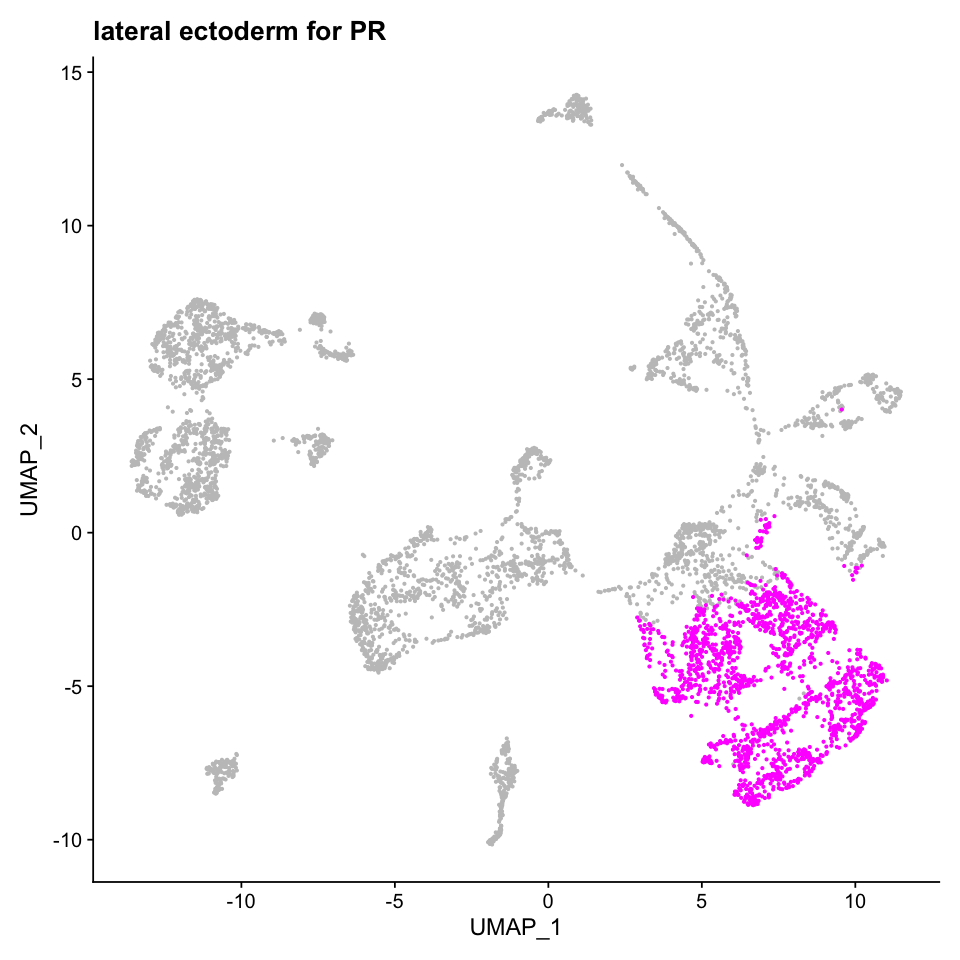

In [7]:
options(repr.plot.width=8, repr.plot.height=8)
highlight.cells <- colnames(seu_HQC_lateralect)
fig <- DimPlot(seu_HQC, reduction =  "umap", cells.highlight = highlight.cells, pt.size = 0.5, sizes.highlight = 0.5,
        cols.highlight = 'magenta', label = FALSE) + NoLegend() + ggtitle('lateral ectoderm for PR')
fig
ggsave(fig, file = './figures/Highlight_for_PR.eps')

## Select identity markers

In [8]:
HVG1000 <- head(VariableFeatures(seu_HQC_lateralect), 1000)
length(HVG1000)
head(HVG1000)

[1] 1000

[1] "sog"   "Abd-B" "salm"  "trn"   "ind"   "Atx-1"

In [9]:
stripe_genes <- c('odd','prd','slp1','slp2','run','en','wg', 'hh',  'mid')
stripe_genes

[1] "odd"  "prd"  "slp1" "slp2" "run"  "en"   "wg"   "hh"   "mid"

In [10]:
normcount_lateralect <- GetAssayData(seu_HQC_lateralect, slot = "data")
dim(normcount_lateralect)

[1] 11239  1717

In [11]:
normcount_lateralect <-normcount_lateralect[HVG1000,]
dim(normcount_lateralect)

[1] 1000 1717

In [12]:
data_stripe <- as.data.frame(t(normcount_lateralect[stripe_genes,  ]))
dim(data_stripe)
head(data_stripe)

[1] 1717    9

,odd,prd,slp1,slp2,run,en,wg,hh,mid
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCACAGGGAGAG,0.000000,1.0986123,3.0445224,1.3862944,2.5649494,0.000000,1.0986123,0.000000,0.6931472
AAACGAAAGACATAGT,0.000000,1.0986123,3.0910425,0.6931472,2.0794415,0.000000,2.8332133,1.609438,0.0000000
AAACGCTCACAGTGAG,1.098612,2.8332133,0.6931472,0.0000000,0.0000000,1.791759,0.6931472,2.890372,2.1972246
AAACGCTGTACCTATG,2.079442,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.000000,2.3025851
AAACGCTGTCCGTTTC,1.791759,0.0000000,0.0000000,0.0000000,1.0986123,1.098612,0.0000000,1.386294,2.3978953
AAACGCTTCGCGGTAC,1.386294,0.6931472,0.6931472,0.0000000,0.6931472,1.945910,0.0000000,2.564949,2.9444390


## dimensionally reduction

In [13]:
set.seed(512)

In [14]:
tsne_stripe <- Rtsne(as.matrix(data_stripe), check_duplicates = FALSE)
head(tsne_stripe)

2.7888429,-28.7801822
-4.5313827,-38.1869494
-9.1915357,19.1528985
23.4313537,13.4258536
5.3544579,23.2800470
-0.3856716,27.2983641
-9.2163612,35.0429546
-6.2577828,-8.7377606
-6.6345948,-22.6707132
10.2009926,5.0722128
8.2156075,-24.2725443


In [15]:
data_stripe_tsne <- data_stripe

In [16]:
data_stripe_tsne$tSNE_1 <- tsne_stripe$Y[,1]
data_stripe_tsne$tSNE_2 <- tsne_stripe$Y[,2]
head(data_stripe_tsne)

,odd,prd,slp1,slp2,run,en,wg,hh,mid,tSNE_1,tSNE_2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCACAGGGAGAG,0.000000,1.0986123,3.0445224,1.3862944,2.5649494,0.000000,1.0986123,0.000000,0.6931472,2.7888429,-28.78018
AAACGAAAGACATAGT,0.000000,1.0986123,3.0910425,0.6931472,2.0794415,0.000000,2.8332133,1.609438,0.0000000,-4.5313827,-38.18695
AAACGCTCACAGTGAG,1.098612,2.8332133,0.6931472,0.0000000,0.0000000,1.791759,0.6931472,2.890372,2.1972246,-9.1915357,19.15290
AAACGCTGTACCTATG,2.079442,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.000000,2.3025851,23.4313537,13.42585
AAACGCTGTCCGTTTC,1.791759,0.0000000,0.0000000,0.0000000,1.0986123,1.098612,0.0000000,1.386294,2.3978953,5.3544579,23.28005
AAACGCTTCGCGGTAC,1.386294,0.6931472,0.6931472,0.0000000,0.6931472,1.945910,0.0000000,2.564949,2.9444390,-0.3856716,27.29836


In [17]:
library(viridis)


Loading required package: viridisLite



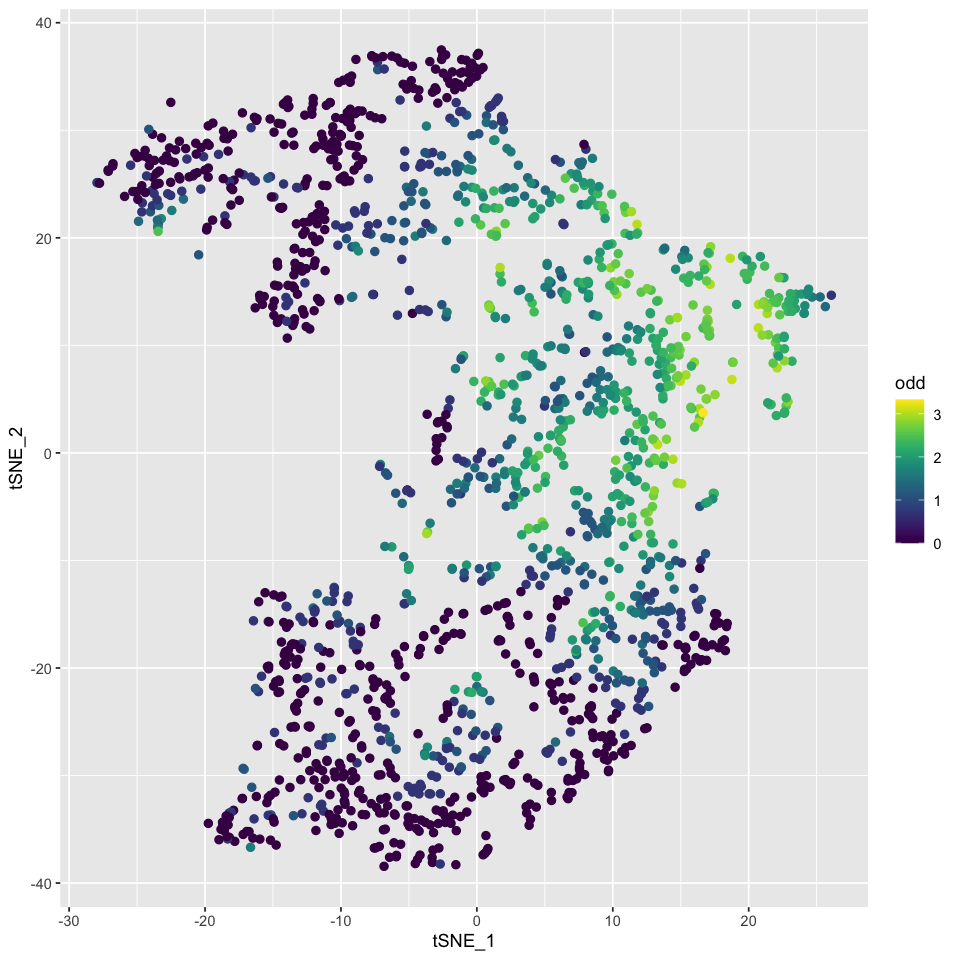

In [18]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = odd))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

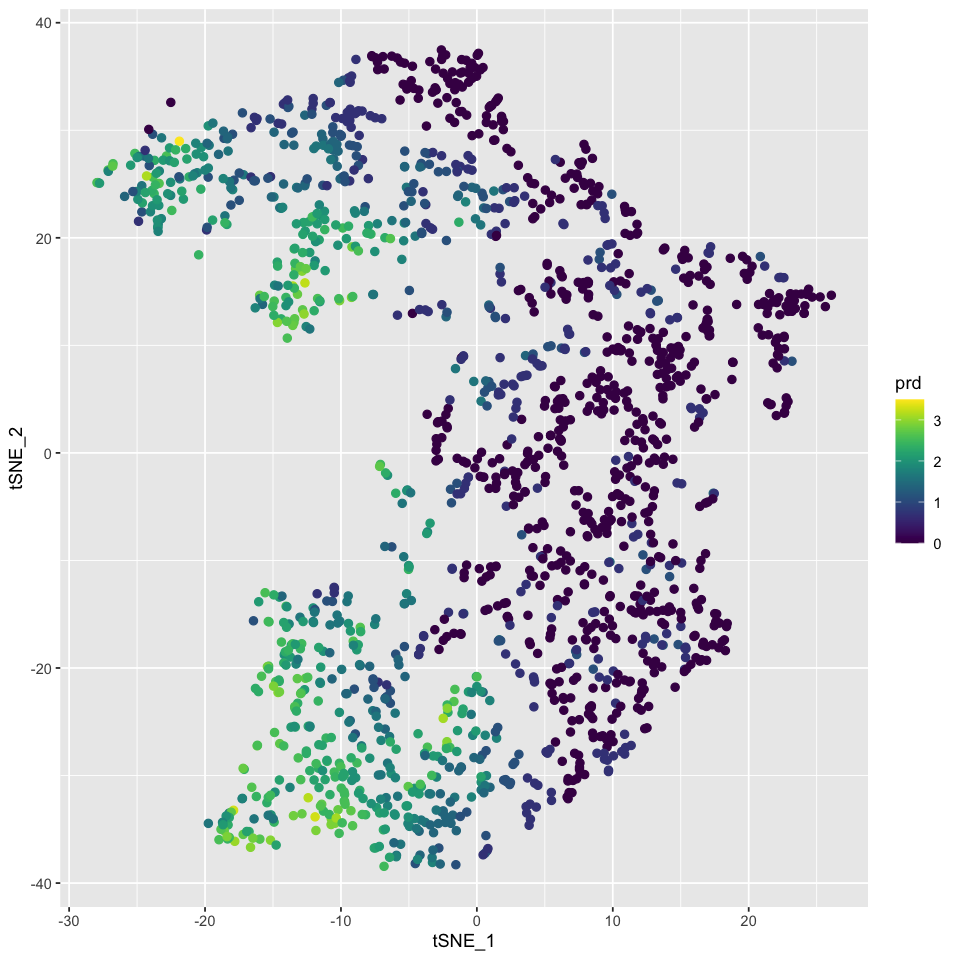

In [19]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = prd))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

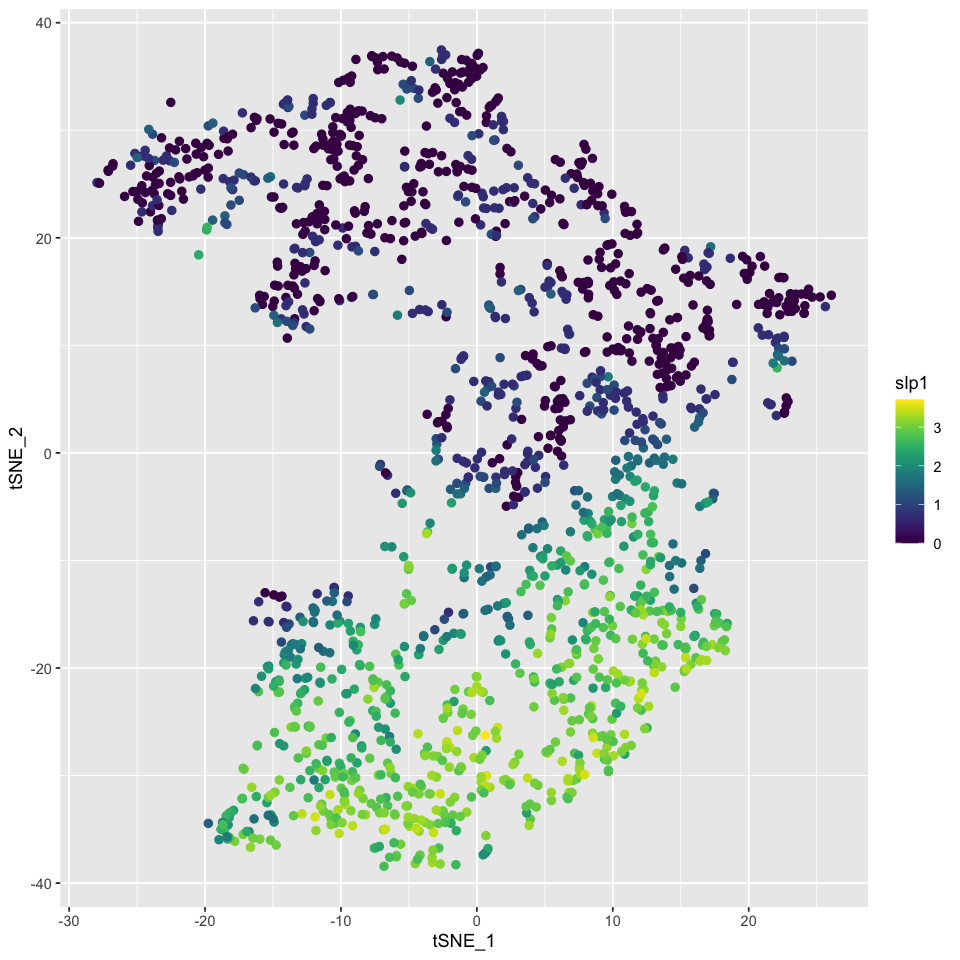

In [20]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = slp1))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

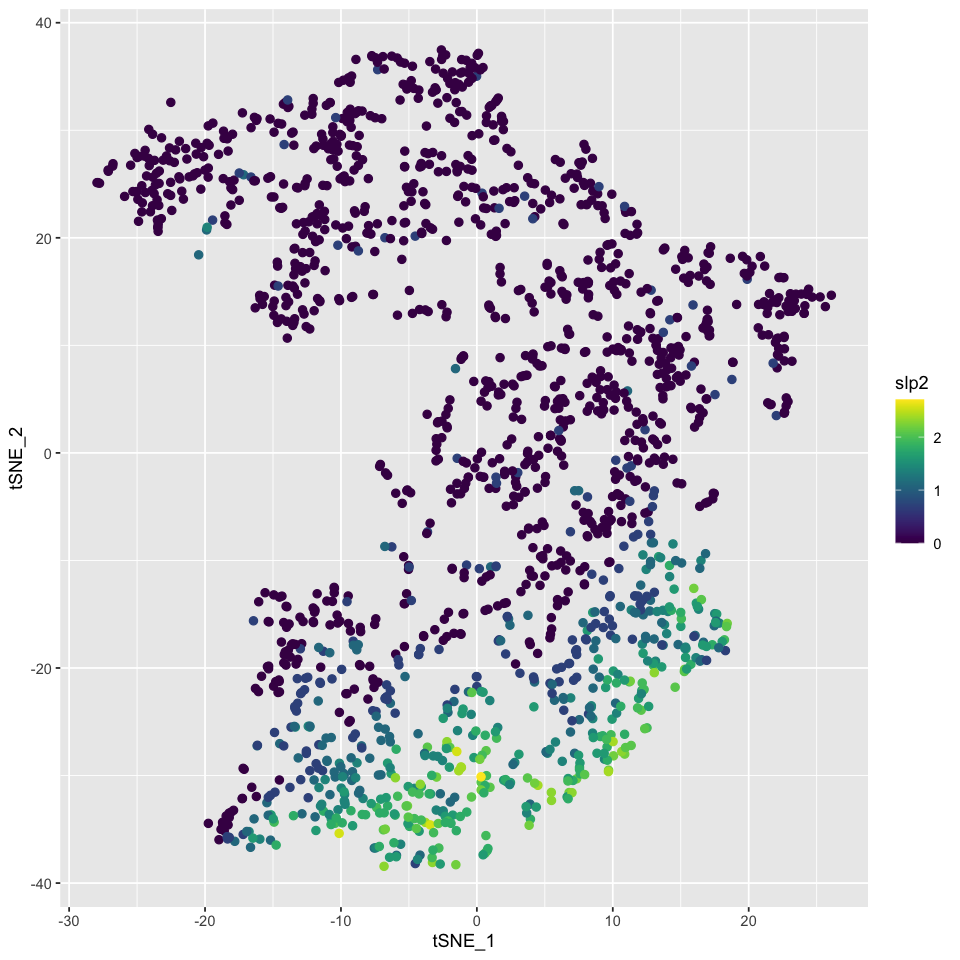

In [21]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = slp2))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

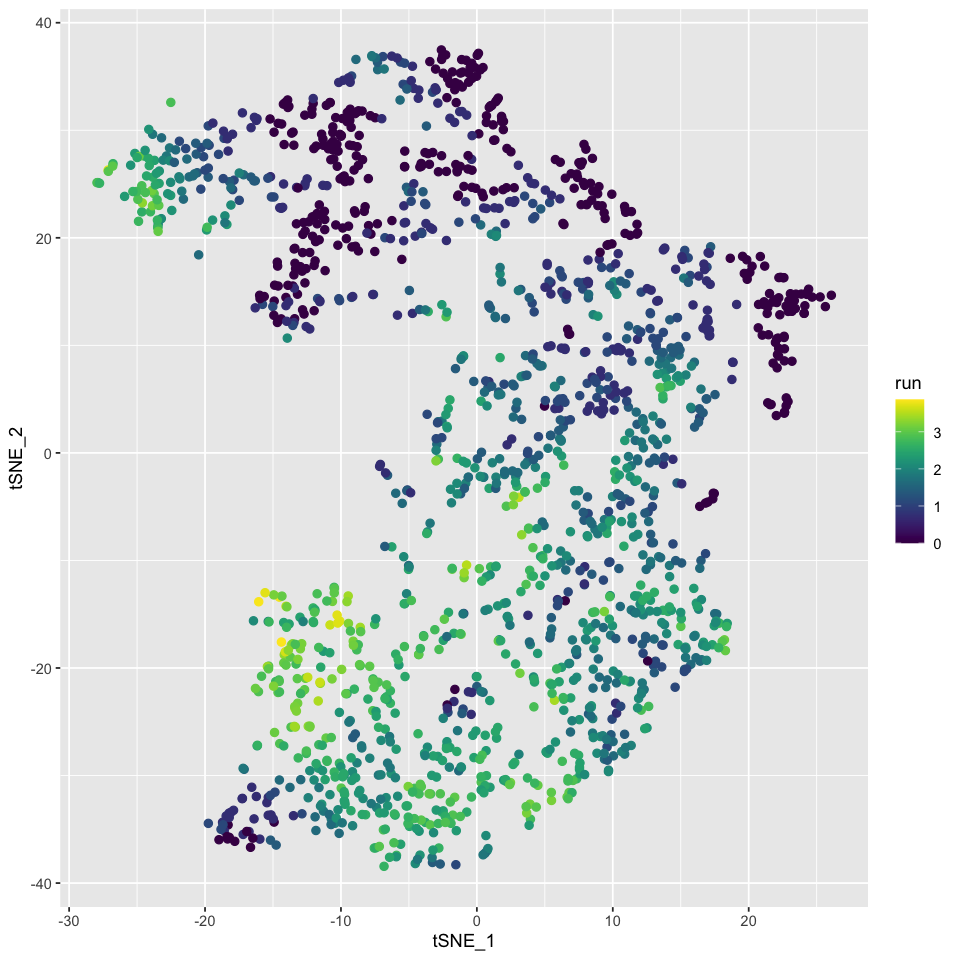

In [22]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = run))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

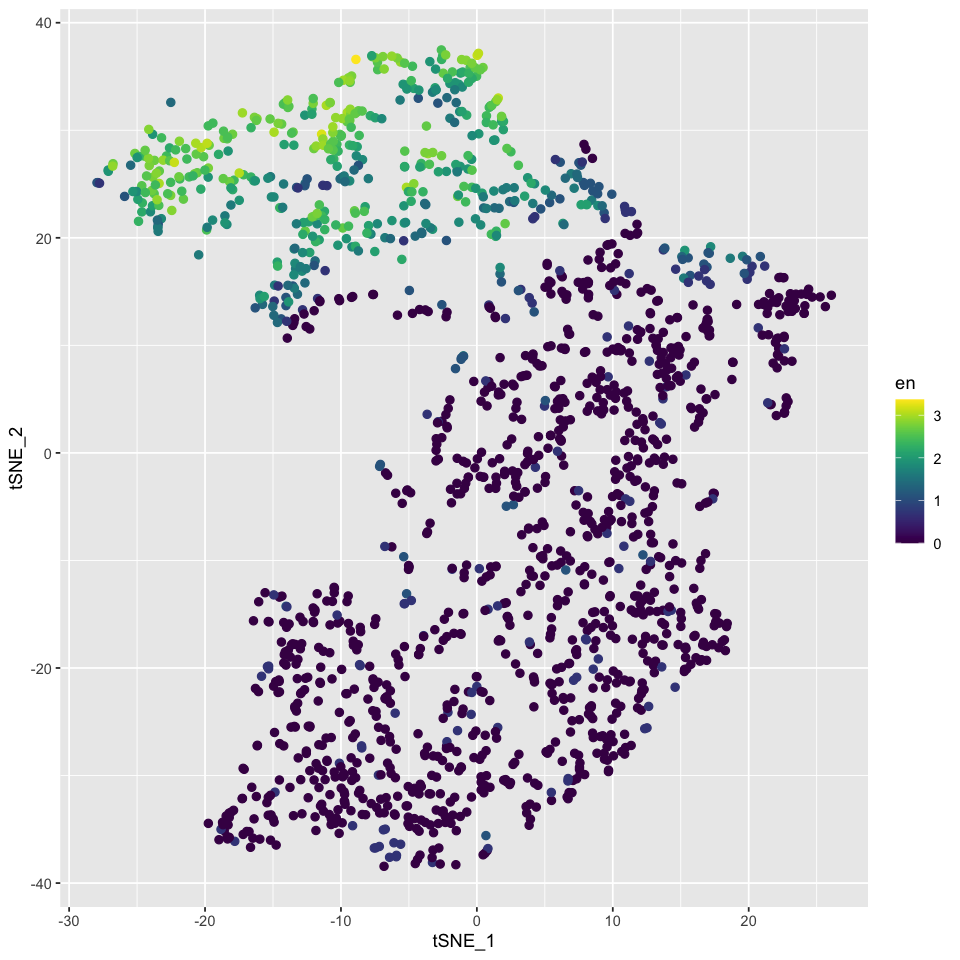

In [23]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = en))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

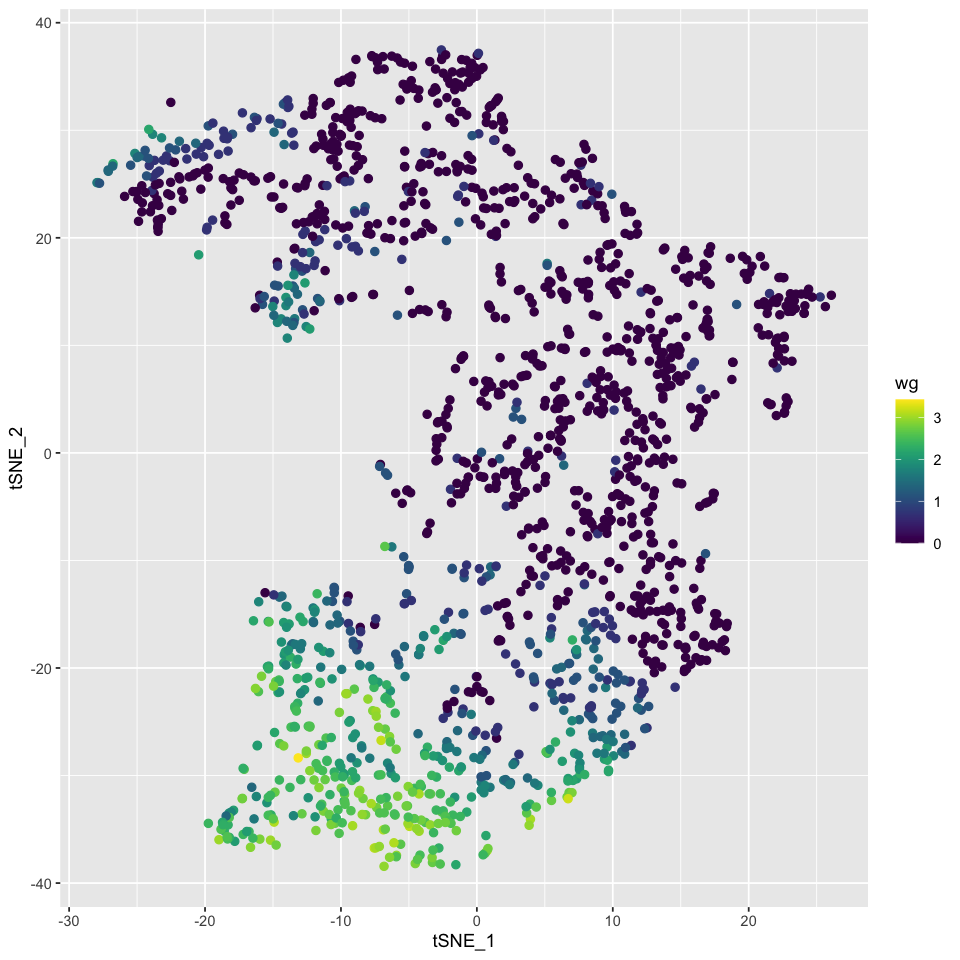

In [24]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = wg))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

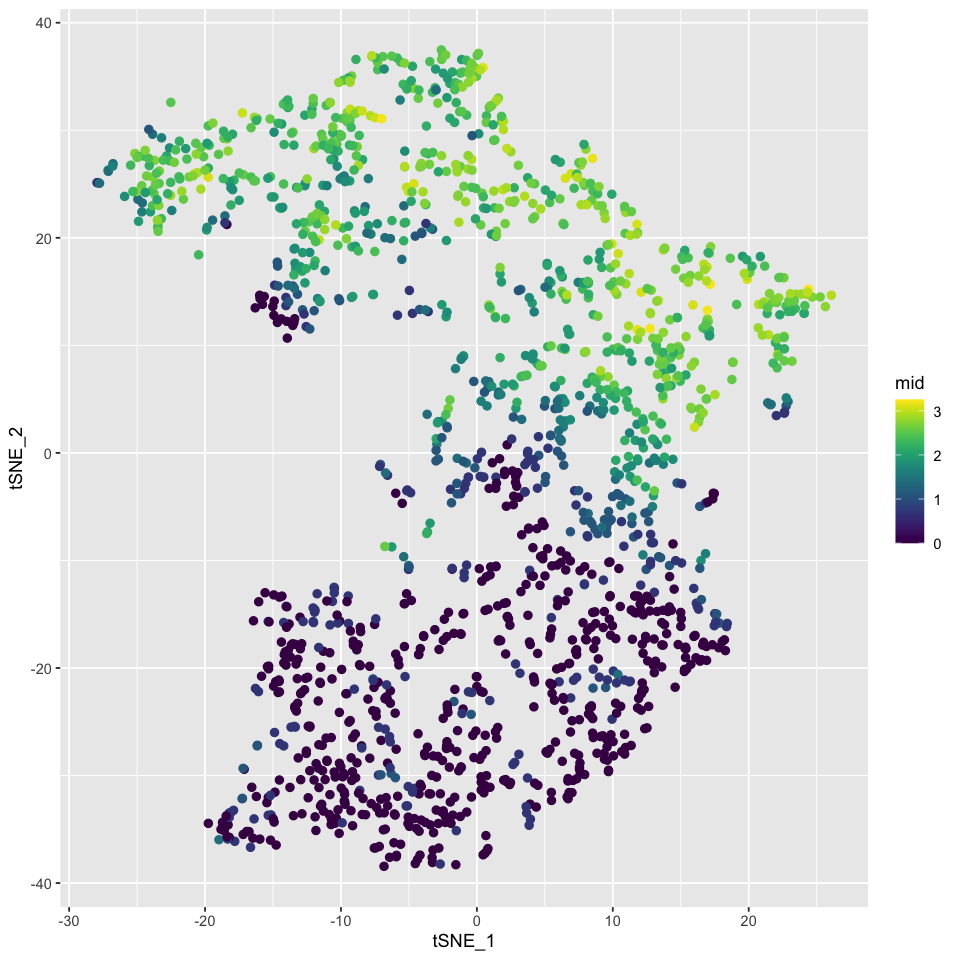

In [25]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = mid))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

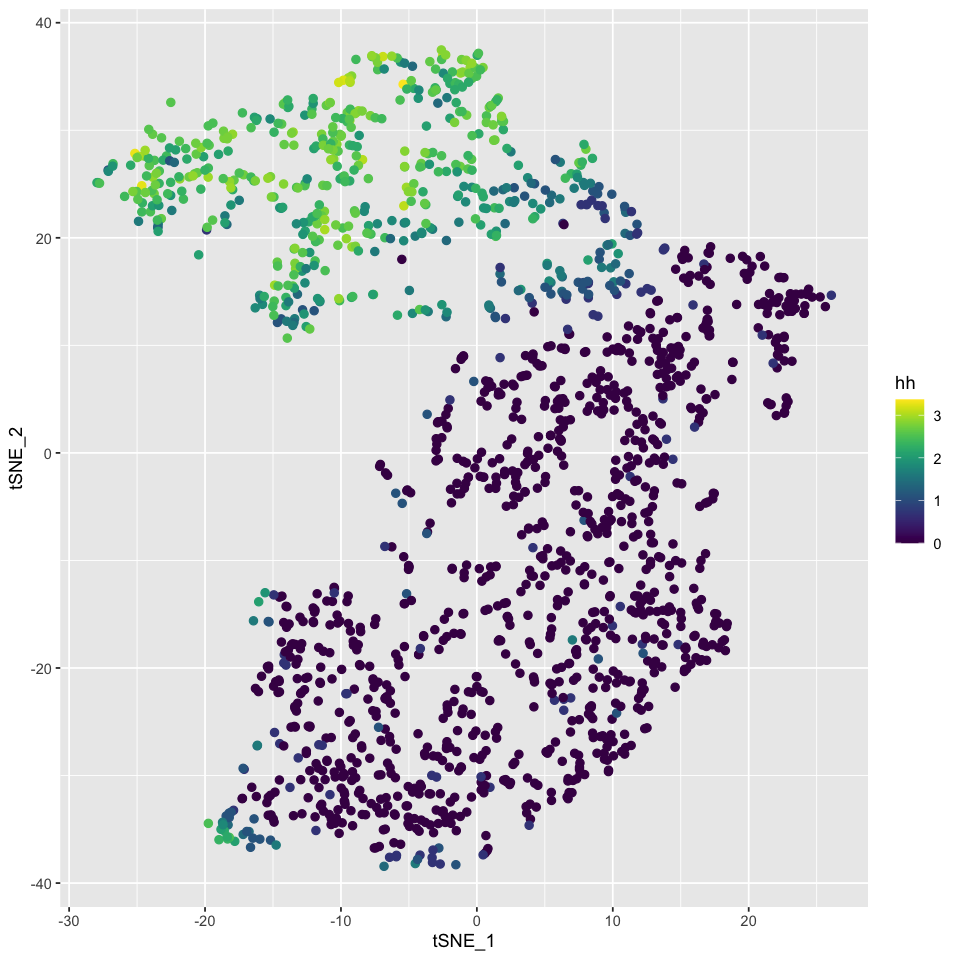

In [26]:
ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = hh))+ geom_point(size = 2)  + scale_color_viridis(option = "D")

## Clustering

In [27]:
set.seed(512) 

In [28]:
kmean_clust <- kmeans(x=data_stripe, centers=4)

In [29]:
kmean_clust

K-means clustering with 4 clusters of sizes 462, 464, 408, 383

Cluster means:
        odd       prd      slp1       slp2       run         en         wg
1 0.4798024 1.2203098 0.2811942 0.03176163 0.7109485 2.06404986 0.30628841
2 2.0510456 0.2227059 0.4443318 0.03847398 1.0259186 0.22276242 0.05465494
3 0.2310269 1.8154000 2.6136992 1.09105499 2.3006720 0.07943142 2.19275928
4 0.9297456 0.3525818 2.3673532 0.75461727 1.9992815 0.07799216 0.42352274
          hh       mid
1 2.34232079 2.2036275
2 0.29054372 2.1231638
3 0.21580867 0.1460453
4 0.05699639 0.3394091

Clustering vector:
AAACCCACAGGGAGAG AAACGAAAGACATAGT AAACGCTCACAGTGAG AAACGCTGTACCTATG 
               3                3                1                2 
AAACGCTGTCCGTTTC AAACGCTTCGCGGTAC AAAGAACAGTAAGGGA AAAGAACGTGGCTACC 
               2                1                1                4 
AAAGGATAGGCTGAAC AAAGGTAAGTTCTCTT AAAGTCCAGACGACTG AAAGTCCAGGGCAAGG 
               3                2                4                

In [30]:
data_stripe_tsne$cluster <- as.factor(kmean_clust$cluster)
head(data_stripe_tsne)

,odd,prd,slp1,slp2,run,en,wg,hh,mid,tSNE_1,tSNE_2,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACCCACAGGGAGAG,0.000000,1.0986123,3.0445224,1.3862944,2.5649494,0.000000,1.0986123,0.000000,0.6931472,2.7888429,-28.78018,3
AAACGAAAGACATAGT,0.000000,1.0986123,3.0910425,0.6931472,2.0794415,0.000000,2.8332133,1.609438,0.0000000,-4.5313827,-38.18695,3
AAACGCTCACAGTGAG,1.098612,2.8332133,0.6931472,0.0000000,0.0000000,1.791759,0.6931472,2.890372,2.1972246,-9.1915357,19.15290,1
AAACGCTGTACCTATG,2.079442,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.000000,2.3025851,23.4313537,13.42585,2
AAACGCTGTCCGTTTC,1.791759,0.0000000,0.0000000,0.0000000,1.0986123,1.098612,0.0000000,1.386294,2.3978953,5.3544579,23.28005,2
AAACGCTTCGCGGTAC,1.386294,0.6931472,0.6931472,0.0000000,0.6931472,1.945910,0.0000000,2.564949,2.9444390,-0.3856716,27.29836,1


Saving 7 x 7 in image



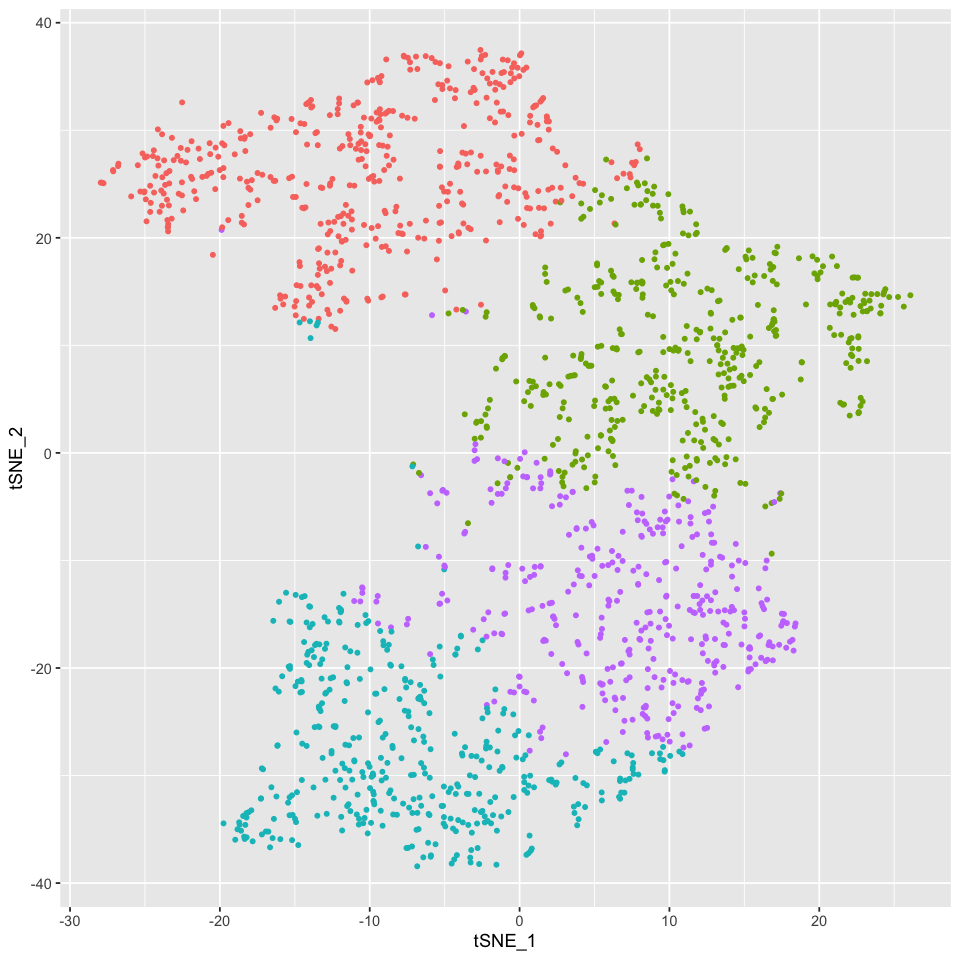

In [31]:
fig <- ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = cluster))+ geom_point(size = 1) + NoLegend()
fig
ggsave(fig, file = "./figures/PR_assignment_tSNE_kmean_clust.eps", dpi = 300)

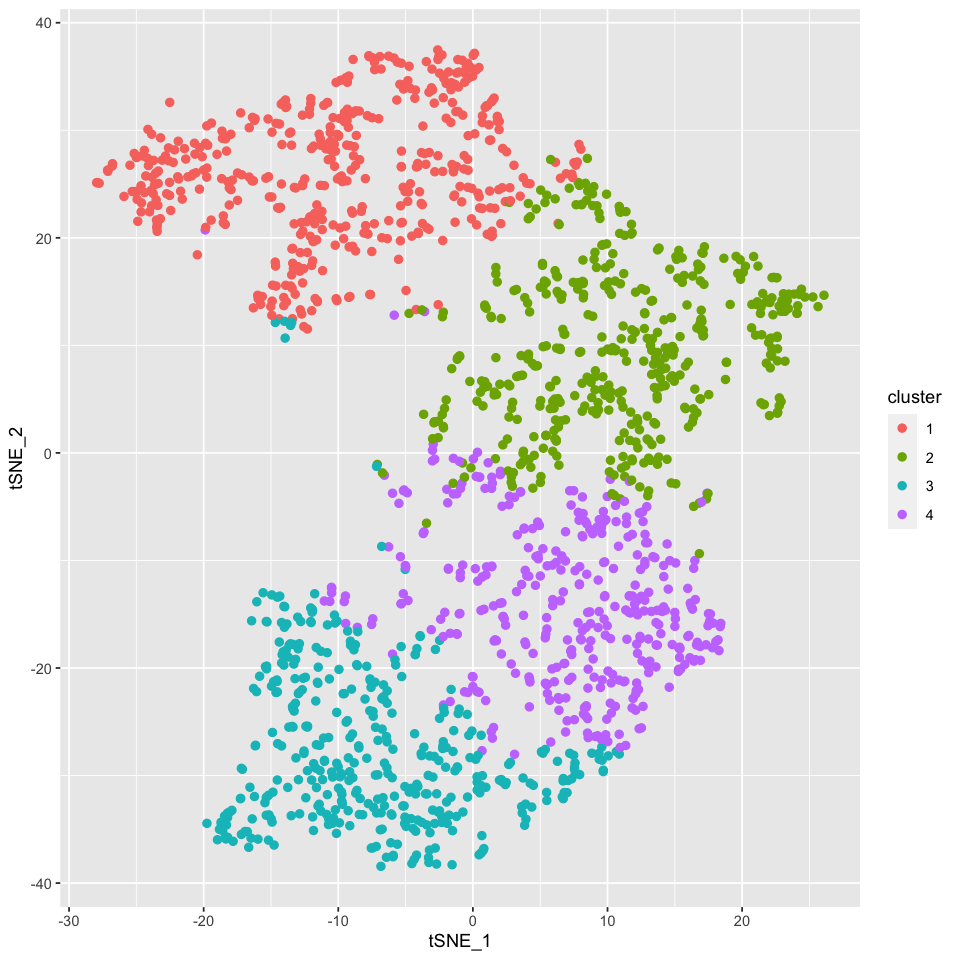

In [32]:
p <- ggplot(data_stripe_tsne,　aes(x=tSNE_1,y=tSNE_2,col = cluster))+ geom_point(size = 2) 
p

In [33]:
data_stripe_tsne_1 <-  filter(data_stripe_tsne, cluster == "1")
dim(data_stripe_tsne_1)
head(data_stripe_tsne_1)
celllist_PR1 <- rownames(data_stripe_tsne_1)
length(celllist_PR1)

[1] 462  12

,odd,prd,slp1,slp2,run,en,wg,hh,mid,tSNE_1,tSNE_2,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACGCTCACAGTGAG,1.098612,2.8332133,0.6931472,0,0.0000000,1.791759,0.6931472,2.890372,2.197225,-9.1915357,19.15290,1
AAACGCTTCGCGGTAC,1.386294,0.6931472,0.6931472,0,0.6931472,1.945910,0.0000000,2.564949,2.944439,-0.3856716,27.29836,1
AAAGAACAGTAAGGGA,0.000000,0.6931472,0.0000000,0,1.0986123,2.772589,0.0000000,2.833213,2.639057,-9.2163612,35.04295,1
AAAGTCCAGGGCAAGG,0.000000,2.3978953,0.6931472,0,0.0000000,1.791759,0.0000000,2.484907,1.609438,-13.4440542,18.96359,1
AAAGTGACAGCTCTGG,0.000000,2.1972246,0.0000000,0,0.0000000,2.079442,0.0000000,2.197225,2.484907,-12.3680329,21.48499,1
AACAACCGTATTTCGG,0.000000,3.4965076,0.0000000,0,1.0986123,2.833213,1.3862944,2.564949,2.197225,-21.8883231,28.98117,1


[1] 462

In [34]:
data_stripe_tsne_2 <-  filter(data_stripe_tsne, cluster == "2")
dim(data_stripe_tsne_2)
head(data_stripe_tsne_2)
celllist_PR2 <- rownames(data_stripe_tsne_2)
length(celllist_PR2)

[1] 464  12

,odd,prd,slp1,slp2,run,en,wg,hh,mid,tSNE_1,tSNE_2,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACGCTGTACCTATG,2.0794415,0,0.0000000,0,0.000000,0.000000,0,0.000000,2.302585,23.431354,13.425854,2
AAACGCTGTCCGTTTC,1.7917595,0,0.0000000,0,1.098612,1.098612,0,1.386294,2.397895,5.354458,23.280047,2
AAAGGTAAGTTCTCTT,1.9459101,0,0.6931472,0,1.098612,0.000000,0,0.000000,2.079442,10.200993,5.072213,2
AAAGTGAGTGTACATC,0.6931472,0,0.0000000,0,2.397895,0.000000,0,0.000000,2.639057,-2.107977,4.138397,2
AAAGTGATCGTAACAC,2.3978953,0,0.6931472,0,2.302585,0.000000,0,0.000000,1.098612,5.054390,-2.197868,2
AACAAGAAGAAACTAC,2.7080502,0,0.6931472,0,0.000000,0.000000,0,0.000000,2.944439,21.457811,10.986325,2


[1] 464

In [35]:
data_stripe_tsne_3 <-  filter(data_stripe_tsne, cluster == "3")
dim(data_stripe_tsne_3)
head(data_stripe_tsne_3)
celllist_PR4 <- rownames(data_stripe_tsne_3)
length(celllist_PR4)

[1] 408  12

,odd,prd,slp1,slp2,run,en,wg,hh,mid,tSNE_1,tSNE_2,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACCCACAGGGAGAG,0,1.098612,3.044522,1.3862944,2.564949,0.0000000,1.098612,0.000000,0.6931472,2.788843,-28.78018,3
AAACGAAAGACATAGT,0,1.098612,3.091042,0.6931472,2.079442,0.0000000,2.833213,1.609438,0.0000000,-4.531383,-38.18695,3
AAAGGATAGGCTGAAC,0,1.098612,2.772589,0.6931472,2.564949,0.0000000,2.302585,0.000000,0.0000000,-6.634595,-22.67071,3
AAAGTCCCAGGTTACT,0,2.079442,0.000000,0.0000000,3.828641,0.0000000,1.386294,0.000000,0.0000000,-14.527179,-13.41039,3
AAAGTCCGTAAGACCG,0,2.197225,2.639057,1.0986123,2.639057,0.6931472,3.135494,0.000000,0.0000000,-7.547169,-36.74066,3
AACACACGTCGTATTG,0,2.397895,2.564949,1.3862944,2.639057,0.6931472,2.079442,0.000000,0.0000000,-10.113431,-28.85855,3


[1] 408

In [36]:
data_stripe_tsne_4 <-  filter(data_stripe_tsne, cluster == "4")
dim(data_stripe_tsne_4)
head(data_stripe_tsne_4)
celllist_PR3 <- rownames(data_stripe_tsne_4)
length(celllist_PR3)

[1] 383  12

,odd,prd,slp1,slp2,run,en,wg,hh,mid,tSNE_1,tSNE_2,cluster
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAAGAACGTGGCTACC,1.9459101,1.098612,1.9459101,0.6931472,2.3978953,0,1.6094379,0,1.9459101,-6.257783,-8.737761,4
AAAGTCCAGACGACTG,0.0000000,0.000000,2.8332133,0.6931472,1.3862944,0,1.0986123,0,0.0000000,8.215608,-24.272544,4
AAAGTCCGTGAATGTA,1.3862944,0.000000,2.3978953,0.6931472,2.3025851,0,0.0000000,0,0.0000000,11.622863,-13.302752,4
AAATGGAAGCTAATGA,0.6931472,0.000000,0.6931472,0.6931472,2.6390573,0,0.6931472,0,1.3862944,-1.450271,-0.502698,4
AACAAGAAGTGGAAGA,0.0000000,0.000000,2.0794415,0.0000000,0.6931472,0,0.0000000,0,0.6931472,5.932847,-13.641534,4
AACACACCAATCGAAA,0.0000000,1.098612,2.8332133,0.0000000,2.5649494,0,1.0986123,0,0.0000000,-5.971418,-18.709823,4


[1] 383

In [37]:
normcount_col1 <- as.data.frame(t(normcount_lateralect[, celllist_PR1]))
head(normcount_col1)
dim(normcount_col1)

,sog,Abd-B,salm,trn,ind,Atx-1,bnl,stg,Dll,eve,⋯,Xbp1,asRNA:CR45145,T48,CaBP1,PlexA,CG32767,Pkc98E,Sr-CIV,B4,CG13640
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACGCTCACAGTGAG,0.000000,0.000000,0.0000000,0.000000,2.564949,3.1780538,0.0000000,3.2580965,0.000000,3.7612001,⋯,1.386294,0,1.386294,3.258097,1.791759,1.386294,0,0,0.000000,0
AAACGCTTCGCGGTAC,4.262680,0.000000,0.6931472,4.615121,0.000000,0.6931472,0.0000000,0.0000000,0.000000,0.6931472,⋯,1.386294,0,1.386294,2.708050,1.098612,2.079442,0,0,0.000000,0
AAAGAACAGTAAGGGA,2.833213,0.000000,0.0000000,4.343805,0.000000,2.8332133,0.0000000,1.3862944,0.000000,1.3862944,⋯,1.945910,0,0.000000,2.944439,1.386294,1.098612,0,0,0.000000,0
AAAGTCCAGGGCAAGG,4.477337,0.000000,0.0000000,1.945910,0.000000,0.6931472,0.0000000,0.6931472,0.000000,3.7376696,⋯,1.609438,0,1.609438,2.833213,1.945910,1.791759,0,0,0.000000,0
AAAGTGACAGCTCTGG,3.044522,1.386294,0.6931472,0.000000,0.000000,3.2958369,0.0000000,0.6931472,0.000000,3.7135721,⋯,1.386294,0,1.098612,2.833213,1.609438,1.386294,0,0,1.098612,0
AACAACCGTATTTCGG,1.945910,0.000000,4.0073332,1.609438,0.000000,2.9444390,0.6931472,2.3025851,2.484907,3.4657359,⋯,1.098612,0,1.386294,3.044522,2.397895,1.945910,0,0,0.000000,0


[1]  462 1000

In [38]:
length(unique(rownames(normcount_col1)))

[1] 462

In [39]:
length(unique(colnames(normcount_col1)))

[1] 1000

## Separate cells into odd/even parasegments

### Col1 (en+)

In [40]:
corr_col1 <- correlate(normcount_col1)　

Warning message in stats::cor(x = x, y = y, use = use, method = method):
“ 標準偏差が 0 です ”

Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




In [41]:
head(corr_col1)

term,sog,Abd-B,salm,trn,ind,Atx-1,bnl,stg,Dll,⋯,Xbp1,asRNA:CR45145,T48,CaBP1,PlexA,CG32767,Pkc98E,Sr-CIV,B4,CG13640
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
sog,NA,-0.13886941,-0.046846216,0.10129795,0.103659072,-0.81896733,-0.3552239,-0.59270779,-0.23543301,⋯,-0.265761385,-0.107634116,0.192482605,-0.09203034,0.02198855,-0.22465301,0.0288938050,0.09502754,-0.06184627,0.022164739
Abd-B,-0.13886941,NA,-0.123651659,-0.26627803,-0.079356136,0.09313382,0.4302767,0.15183361,-0.01408707,⋯,-0.008530855,-0.001449536,0.001498795,0.09441163,-0.01451553,-0.02817156,0.0003604418,-0.05504097,0.01670659,-0.019235178
salm,-0.04684622,-0.12365166,NA,-0.08796118,0.003903583,-0.02530488,0.2808093,0.17933864,0.55522935,⋯,0.056050780,-0.029957789,0.055277108,0.02260351,0.14043379,0.08141956,0.0431428871,-0.02963064,-0.01029335,0.003207579
trn,0.10129795,-0.26627803,-0.087961182,NA,-0.149640274,-0.04617893,-0.1432458,-0.27010493,-0.13079755,⋯,-0.036308999,-0.061513011,-0.115781889,-0.01500453,0.02860959,0.07448302,0.0066348687,-0.02075059,0.08925486,-0.046572443
ind,0.10365907,-0.07935614,0.003903583,-0.14964027,NA,-0.26381860,-0.1120659,0.04182265,-0.07445901,⋯,-0.021217778,-0.008190573,0.101655506,0.04938429,-0.00805762,-0.02384632,0.0046564179,0.09690946,-0.02839829,0.103018342
Atx-1,-0.81896733,0.09313382,-0.025304877,-0.04617893,-0.263818602,NA,0.1742916,0.41276346,0.10634215,⋯,0.222722330,0.079123963,-0.119988561,0.09368803,0.01756884,0.15873574,0.0228105218,-0.08310874,-0.03349640,-0.030192419


In [42]:
corr_col1_trn <- focus(corr_col1, "trn")
corr_col1_trn <- na.omit(corr_col1_trn)
corr_col1_trn[order(-corr_col1_trn$trn), ]

term,trn
<chr>,<dbl>
ftz,0.8810011
comm,0.7941440
comm2,0.6533243
run,0.6347300
18w,0.5991501
corto,0.5497186
blot,0.4505494
lncRNA:noe,0.4271130
noc,0.4015345


In [43]:
corr_col1_trn <- corr_col1_trn[corr_col1_trn$trn >0.35 | corr_col1_trn$trn < -0.35, ]
dim(corr_col1_trn)

[1] 24  2

In [44]:
normcount_col1_trn_corr <- normcount_col1[, c("trn", corr_col1_trn$term) ]
head(normcount_col1_trn_corr)
dim(normcount_col1_trn_corr)

,trn,eve,gsb,pri,ftz,ImpL2,Toll-6,ich,Antp,pxb,⋯,h,blot,rdx,noc,Alh,comm2,rst,fz,lncRNA:noe,corto
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACGCTCACAGTGAG,0.000000,3.7612001,0.000000,1.3862944,0.6931472,4.700480,0.6931472,3.218876,3.496508,2.772589,⋯,2.397895,1.791759,2.397895,0.000000,1.0986123,0.0000000,0.6931472,1.945910,0.6931472,2.564949
AAACGCTTCGCGGTAC,4.615121,0.6931472,0.000000,0.6931472,3.1354942,2.397895,0.6931472,0.000000,3.178054,0.000000,⋯,1.098612,2.772589,2.833213,2.302585,0.6931472,0.0000000,0.6931472,1.609438,1.3862944,3.135494
AAAGAACAGTAAGGGA,4.343805,1.3862944,0.000000,0.0000000,3.2580965,3.583519,1.6094379,0.000000,2.639057,0.000000,⋯,0.000000,2.890372,2.079442,2.079442,0.6931472,0.6931472,0.6931472,1.386294,1.3862944,2.564949
AAAGTCCAGGGCAAGG,1.945910,3.7376696,2.833213,3.0910425,0.6931472,2.995732,2.6390573,2.079442,2.302585,2.944439,⋯,1.945910,1.791759,3.178054,1.791759,1.6094379,0.0000000,0.0000000,2.197225,1.0986123,2.890372
AAAGTGACAGCTCTGG,0.000000,3.7135721,3.135494,2.7725887,0.0000000,3.912023,3.1354942,3.496508,1.098612,2.639057,⋯,2.197225,0.000000,2.564949,1.609438,1.0986123,0.0000000,0.0000000,1.791759,1.0986123,1.386294
AACAACCGTATTTCGG,1.609438,3.4657359,2.079442,1.3862944,0.0000000,2.397895,1.7917595,2.708050,0.000000,2.708050,⋯,1.791759,2.397895,3.091042,2.302585,1.0986123,0.0000000,0.0000000,1.791759,0.0000000,2.772589


[1] 462  25

In [45]:
set.seed(256)

In [46]:
kmean_col1 <- kmeans(x=normcount_col1_trn_corr, centers=2)

In [47]:
kmean_col1

K-means clustering with 2 clusters of sizes 285, 177

Cluster means:
       trn      eve       gsb       pri       ftz    ImpL2    Toll-6       ich
1 1.182032 2.866496 1.8523100 1.9594995 0.1947584 3.219969 1.7435418 2.5574871
2 4.462808 1.187396 0.6352059 0.8592148 2.8853786 2.426667 0.9266996 0.6460401
      Antp       pxb      18w    Tollo       run     MFS14      comm         h
1 2.215946 2.4496160 1.378175 3.406674 0.2604725 1.4355817 0.2022259 1.2121009
2 2.967981 0.3056729 2.510387 1.495125 1.4362910 0.7839817 1.7102252 0.3799509
      blot      rdx      noc       Alh      comm2        rst       fz
1 1.763337 2.709117 1.212981 1.3788752 0.06649312 0.08920853 2.074708
2 2.371840 2.248048 1.867456 0.8001378 1.02702339 0.42412174 1.510407
  lncRNA:noe    corto
1  0.4351384 2.247146
2  1.0231951 2.745456

Clustering vector:
AAACGCTCACAGTGAG AAACGCTTCGCGGTAC AAAGAACAGTAAGGGA AAAGTCCAGGGCAAGG 
               1                2                2                1 
AAAGTGACAGCTCTGG AACAAC

In [48]:
col1_ID <- as.data.frame(kmean_col1$cluster)
colnames(col1_ID) <- c("pairrule_ID")
head(col1_ID)

,pairrule_ID
,<int>
AAACGCTCACAGTGAG,1
AAACGCTTCGCGGTAC,2
AAAGAACAGTAAGGGA,2
AAAGTCCAGGGCAAGG,1
AAAGTGACAGCTCTGG,1
AACAACCGTATTTCGG,1


In [49]:
col1_ID$pairrule_ID <- gsub("1", "O1", col1_ID$pairrule_ID) 
col1_ID$pairrule_ID <- gsub("2", "E1", col1_ID$pairrule_ID) 

head(col1_ID)

,pairrule_ID
,<chr>
AAACGCTCACAGTGAG,O1
AAACGCTTCGCGGTAC,E1
AAAGAACAGTAAGGGA,E1
AAAGTCCAGGGCAAGG,O1
AAAGTGACAGCTCTGG,O1
AACAACCGTATTTCGG,O1


In [50]:
pca_col1<-prcomp(normcount_col1_trn_corr)

In [51]:
pca_col1 <- as.data.frame(pca_col1$x)
pca_col1$pairrule_ID <- col1_ID$pairrule_ID
head(pca_col1)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC17,PC18,PC19,PC20,PC21,PC22,PC23,PC24,PC25,pairrule_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAACGCTCACAGTGAG,-3.371014,2.53731656,-1.8595489,-0.2110471,1.7637010,-1.376643592,-0.51356977,1.3454754,-0.3455386553,-0.06792024,⋯,0.46488922,0.40459033,-0.33140999,-0.04774427,0.83046808,0.02705680,0.27137378,0.12526490,-0.41473529,O1
AAACGCTTCGCGGTAC,4.253846,0.05528173,-0.8700341,-0.4934132,-0.2109039,-0.007919056,1.48775944,-0.5010200,-0.3944922762,-0.45187939,⋯,0.07310566,0.22573198,-0.48934838,-0.34962221,0.18491830,0.28060956,-0.07065741,0.26466125,-0.16115002,E1
AAAGAACAGTAAGGGA,4.469585,-0.10692916,-1.1535597,0.1657762,-0.5849477,-0.525110099,-0.17163700,0.8284498,0.5417404971,-1.11323254,⋯,0.16713108,0.75916321,0.14375394,-0.28027815,-0.10939684,0.15635544,0.39098295,0.09402471,-0.09033026,E1
AAAGTCCAGGGCAAGG,-2.787286,-0.86104864,1.6860665,-0.4961762,-0.1003960,-0.267803840,0.76269651,0.4005776,-0.2422669937,-1.03598352,⋯,0.65414172,-0.32922336,-0.01805074,-0.08204382,0.63454055,-0.01541968,-0.43220354,-0.15846160,0.05193881,O1
AAAGTGACAGCTCTGG,-5.114736,-0.19186002,0.6120009,-0.3991281,-0.5960321,1.208358191,-1.38151660,0.9068084,0.0003056574,-0.66900396,⋯,0.63124925,-0.63667325,-0.32150150,0.34584347,-0.03517609,0.12655622,0.08469028,-0.06768456,0.14052395,O1
AACAACCGTATTTCGG,-2.744479,0.59133355,1.1057434,1.6502258,-0.9043040,0.767072683,0.05443159,-0.7000518,-0.0399397602,-1.13257370,⋯,-0.97883310,0.05680749,0.27347678,-0.35033535,0.13220146,0.89930436,-0.33359717,0.16884363,-0.03142747,O1


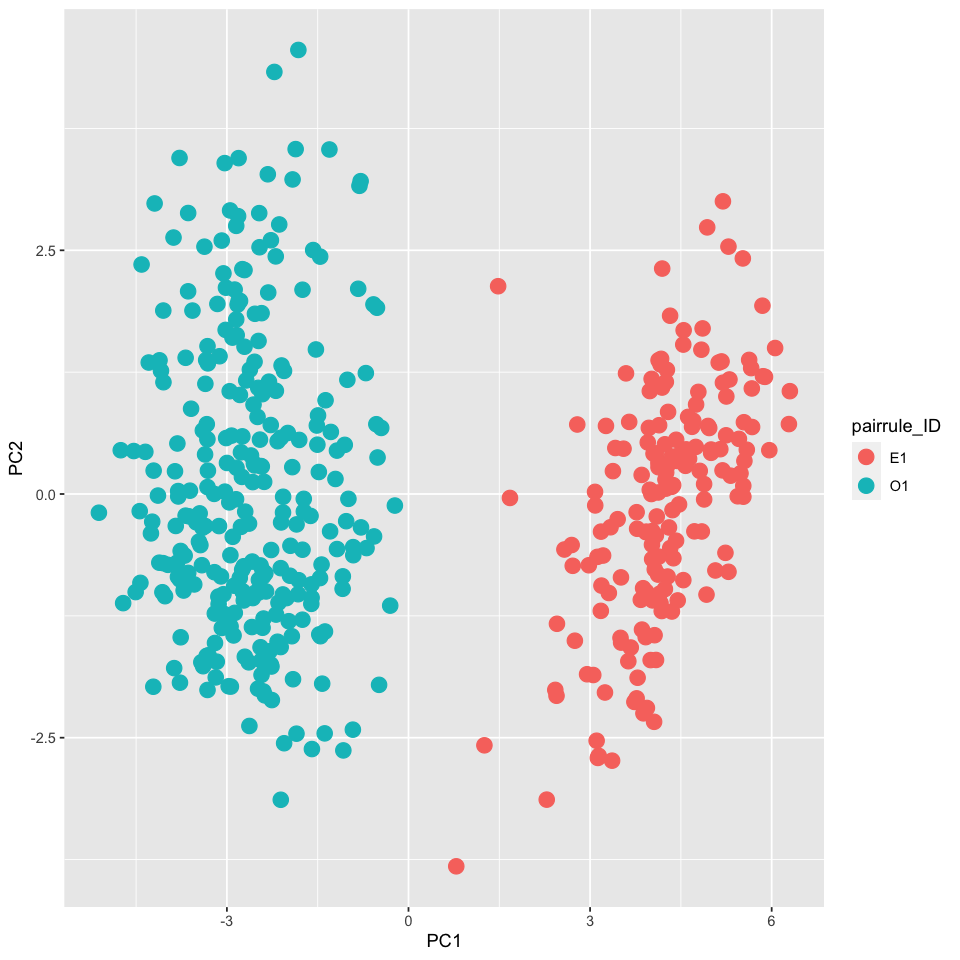

Saving 7 x 7 in image



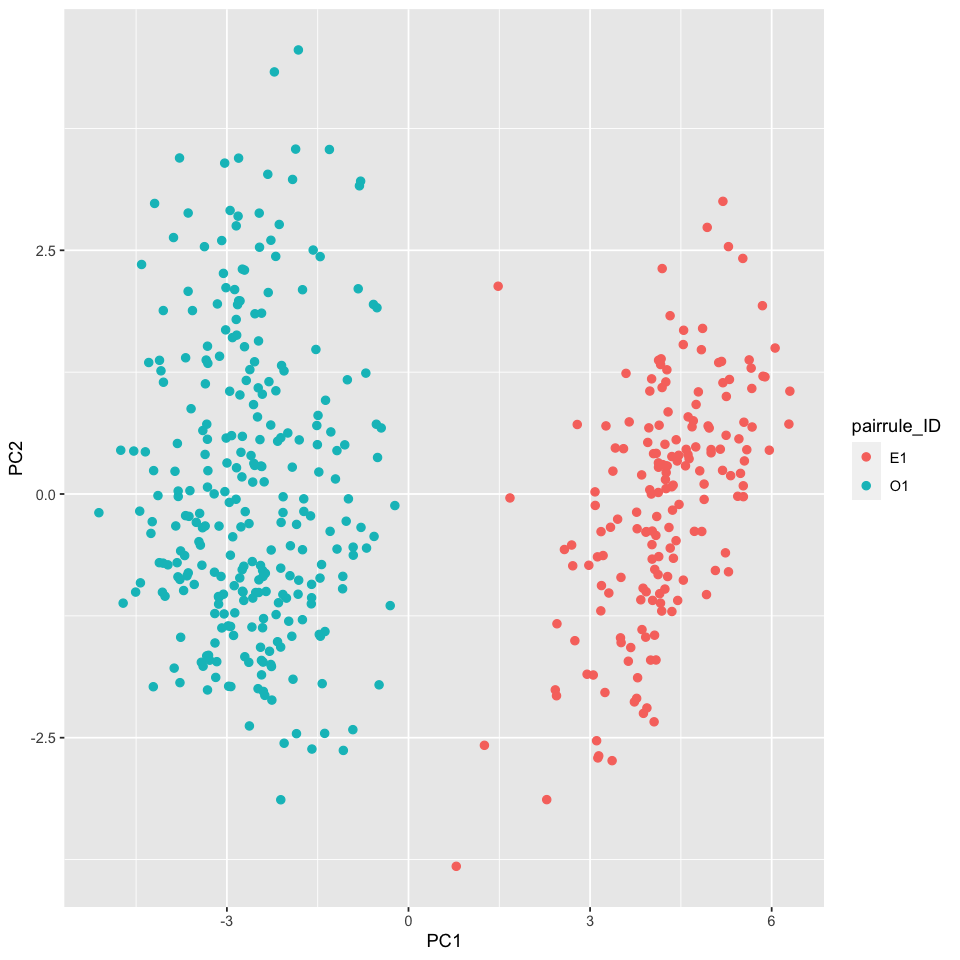

In [52]:
ggplot(pca_col1,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 4)
fig <- ggplot(pca_col1,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 2)  
fig
ggsave(fig, file = "./figures/PR_assignment_col1_1.eps", dpi = 300)

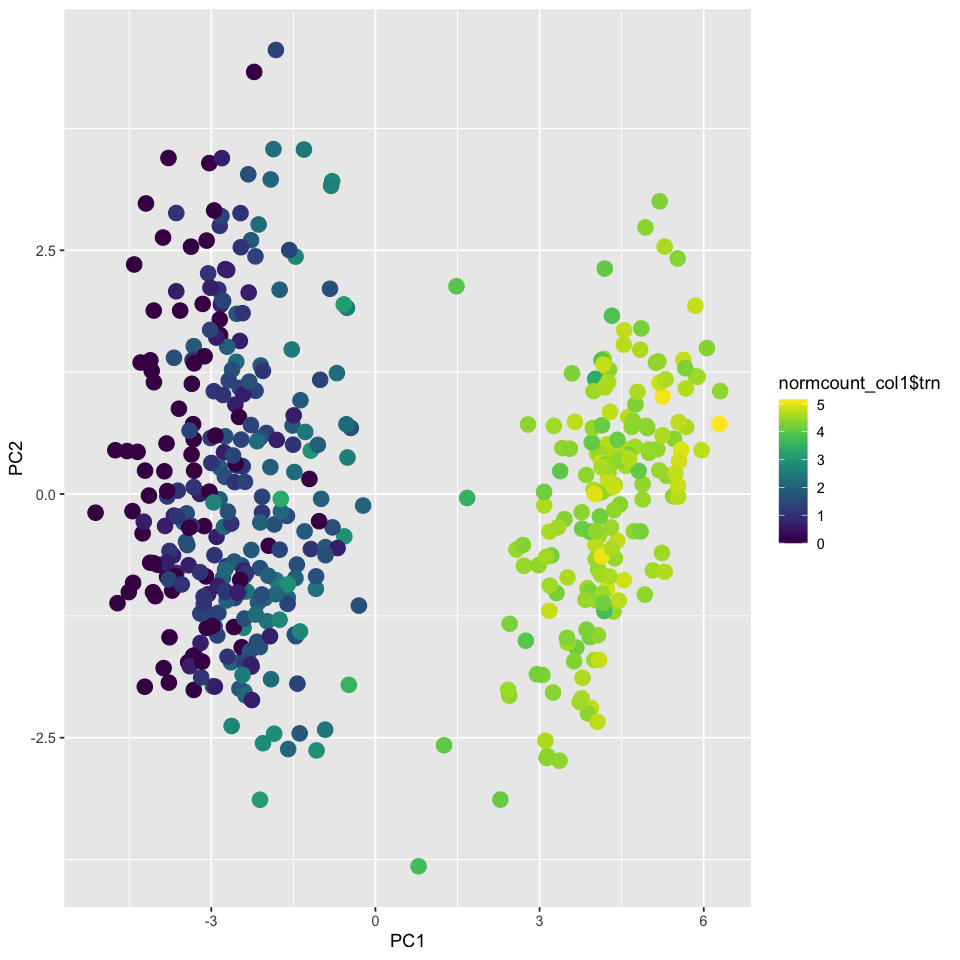

In [53]:
ggplot(pca_col1,　aes(x=PC1,y=PC2 ,col = normcount_col1$trn))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

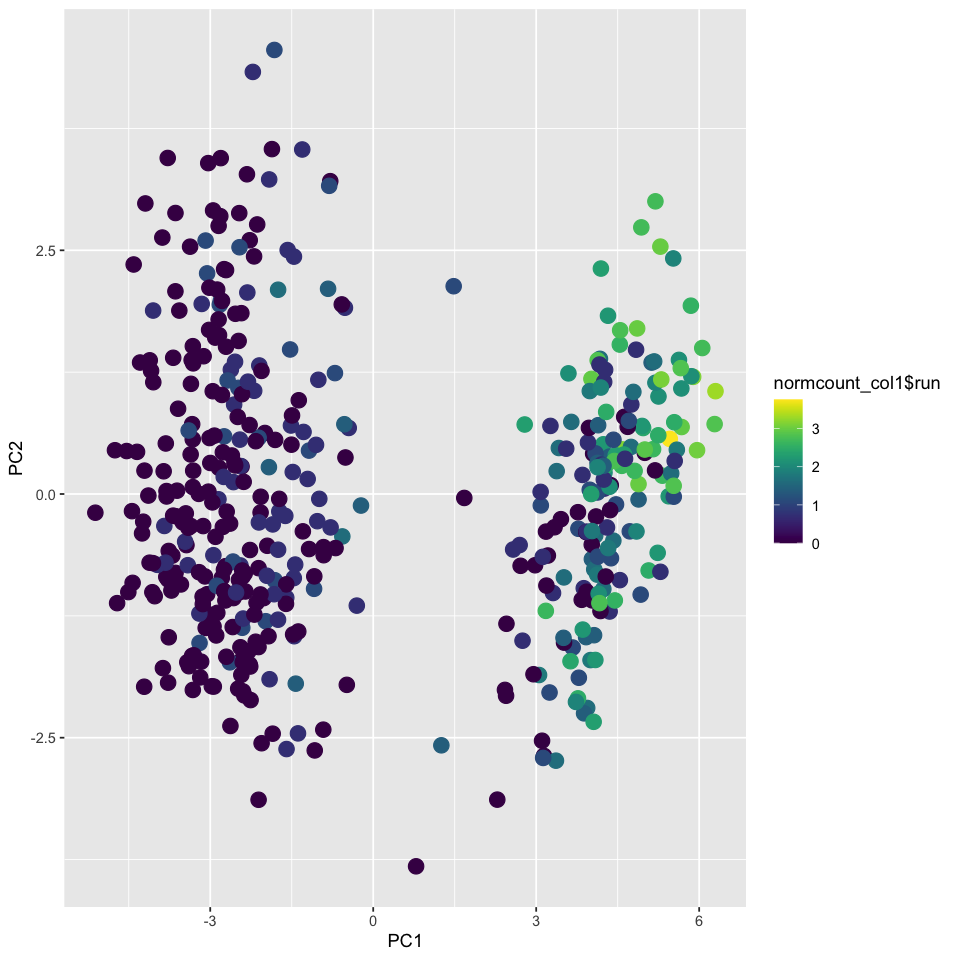

In [54]:
ggplot(pca_col1,　aes(x=PC1,y=PC2 ,col = normcount_col1$run))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

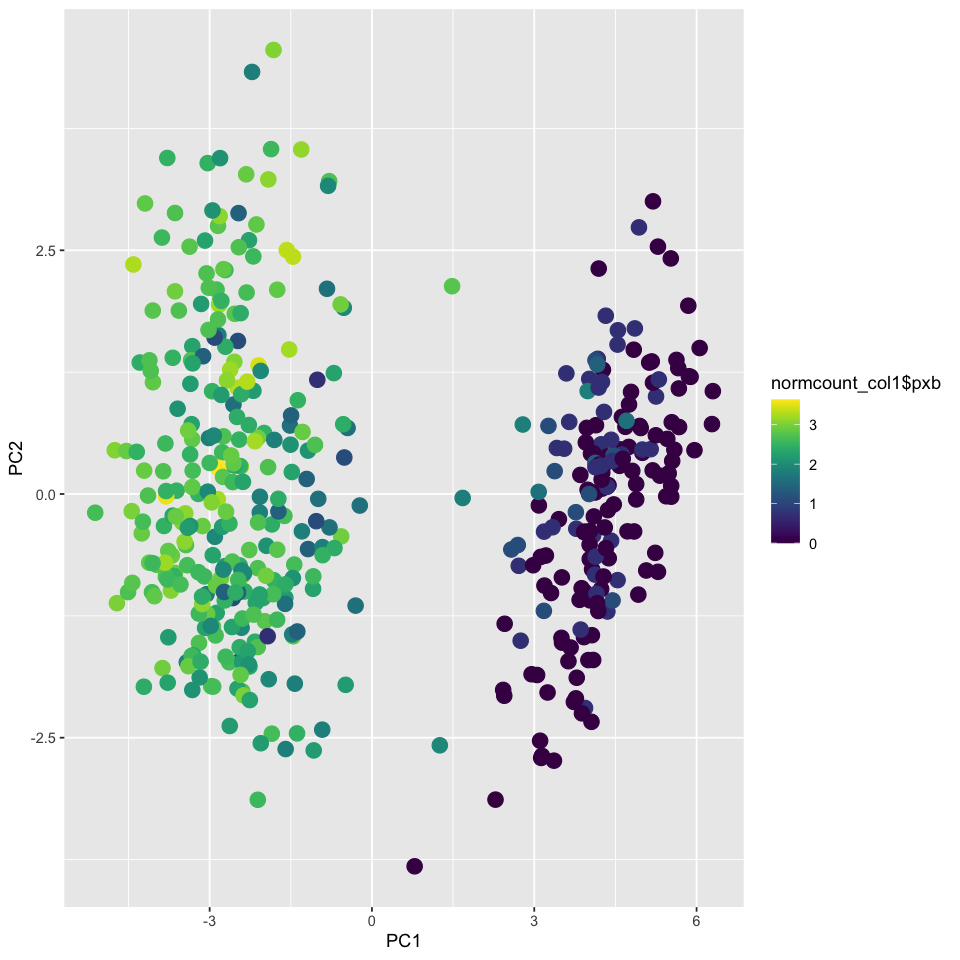

In [55]:
ggplot(pca_col1,　aes(x=PC1,y=PC2 ,col = normcount_col1$pxb))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

### Col2 (odd+)

In [56]:
normcount_col2 <- as.data.frame(t(normcount_lateralect[, celllist_PR2]))
head(normcount_col2)
dim(normcount_col2)

,sog,Abd-B,salm,trn,ind,Atx-1,bnl,stg,Dll,eve,⋯,Xbp1,asRNA:CR45145,T48,CaBP1,PlexA,CG32767,Pkc98E,Sr-CIV,B4,CG13640
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACGCTGTACCTATG,0.0000000,3.988984,0.0000000,0.0000000,0.0000000,4.330733,2.302585,3.1780538,0.0000000,3.526361,⋯,1.3862944,0,1.0986123,2.708050,1.386294,2.079442,0,0,0.000000,0
AAACGCTGTCCGTTTC,4.6539604,0.000000,0.0000000,4.7361984,0.6931472,1.098612,0.000000,0.6931472,0.6931472,1.791759,⋯,1.0986123,0,0.0000000,3.218876,1.609438,2.397895,0,0,1.098612,0
AAAGGTAAGTTCTCTT,2.7725887,0.000000,0.6931472,4.5849675,0.0000000,4.442651,0.000000,0.0000000,0.6931472,0.000000,⋯,1.3862944,0,0.6931472,2.944439,1.791759,2.397895,0,0,0.000000,0
AAAGTGAGTGTACATC,3.0445224,0.000000,0.6931472,4.6634391,3.4965076,1.386294,0.000000,1.7917595,0.0000000,0.000000,⋯,1.0986123,0,0.0000000,2.397895,1.609438,1.098612,0,0,0.000000,0
AAAGTGATCGTAACAC,0.6931472,0.000000,0.0000000,0.6931472,0.6931472,2.944439,0.000000,2.9444390,0.0000000,1.386294,⋯,1.0986123,0,1.0986123,3.091042,1.791759,2.397895,0,0,0.000000,0
AACAAGAAGAAACTAC,4.4426513,0.000000,0.6931472,2.1972246,0.0000000,0.000000,0.000000,0.0000000,0.0000000,0.000000,⋯,0.6931472,0,1.6094379,2.639057,1.945910,1.945910,0,0,0.000000,0


[1]  464 1000

In [57]:
corr_col2 <- correlate(normcount_col2)

Warning message in stats::cor(x = x, y = y, use = use, method = method):
“ 標準偏差が 0 です ”

Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




In [58]:
corr_col2_trn <- focus(corr_col2, "trn")
corr_col2_trn <- na.omit(corr_col2_trn)
corr_col2_trn[order(-corr_col2_trn$trn), ]

term,trn
<chr>,<dbl>
ftz,0.7696116
comm,0.6991272
comm2,0.6484198
CG10479,0.6057190
Ppa,0.5129440
corto,0.4943640
noc,0.4725806
CG4702,0.4338535
Ubx,0.4141899


In [59]:
corr_col2_trn <- corr_col2_trn[corr_col2_trn$trn >0.35 | corr_col2_trn$trn < -0.35, ]
dim(corr_col2_trn)

[1] 28  2

In [60]:
normcount_col2_trn_corr <- normcount_col2[, c("trn", corr_col2_trn$term) ]
head(normcount_col2_trn_corr)
dim(normcount_col2_trn_corr)

,trn,stg,eve,ftz,ImpL2,CG4702,Ubx,Toll-6,halo,ich,⋯,path,noc,comm2,fz,Ppa,lncRNA:noe,CG2162,RhoGAP71E,corto,drongo
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACGCTGTACCTATG,0.0000000,3.1780538,3.526361,0.000000,3.637586,0.0000000,0.6931472,2.0794415,1.0986123,3.367296,⋯,2.1972246,0.6931472,0.000000,2.197225,2.079442,0.0000000,1.3862944,2.995732,2.197225,2.079442
AAACGCTGTCCGTTTC,4.7361984,0.6931472,1.791759,2.890372,3.555348,0.0000000,2.6390573,0.6931472,1.0986123,0.000000,⋯,1.3862944,2.3978953,0.000000,1.098612,2.708050,0.6931472,0.6931472,2.564949,3.135494,1.609438
AAAGGTAAGTTCTCTT,4.5849675,0.0000000,0.000000,2.995732,4.007333,0.0000000,3.1780538,0.0000000,0.6931472,0.000000,⋯,0.0000000,0.6931472,1.945910,2.302585,3.044522,1.6094379,1.0986123,1.791759,2.079442,2.302585
AAAGTGAGTGTACATC,4.6634391,1.7917595,0.000000,0.000000,3.401197,1.0986123,2.7080502,0.0000000,0.0000000,0.000000,⋯,2.3978953,1.7917595,1.791759,1.609438,2.639057,0.6931472,0.6931472,1.609438,2.995732,1.945910
AAAGTGATCGTAACAC,0.6931472,2.9444390,1.386294,0.000000,4.595120,0.6931472,1.9459101,0.0000000,1.3862944,3.091042,⋯,0.6931472,0.6931472,0.000000,2.302585,1.945910,1.0986123,1.6094379,2.484907,2.079442,2.397895
AACAAGAAGAAACTAC,2.1972246,0.0000000,0.000000,0.000000,4.795791,0.0000000,0.6931472,2.0794415,2.3978953,1.609438,⋯,2.8332133,1.3862944,0.000000,1.098612,1.791759,0.6931472,0.0000000,2.484907,2.302585,2.772589


[1] 464  29

In [61]:
set.seed(256) 
kmean_col2 <- kmeans(x=normcount_col2_trn_corr, centers=2)

In [62]:
kmean_col2

K-means clustering with 2 clusters of sizes 203, 261

Cluster means:
       trn      stg       eve       ftz    ImpL2    CG4702      Ubx    Toll-6
1 4.523351 1.407689 0.7938009 2.2257312 2.522036 1.0489714 2.303598 0.9328388
2 1.258303 2.064414 1.6631867 0.2512014 3.927033 0.1905916 1.140833 2.1818689
       halo       ich    Tollo   CG17716      Cys   CG10479       dpn      comm
1 0.5503454 0.1959534 1.876485 0.0728653 4.390983 1.6778592 0.7191865 1.7133615
2 1.4539787 2.0818043 3.153272 0.5133183 4.853803 0.5916527 0.1529824 0.4158209
       sprt    5-HT2A     blot     path      noc     comm2       fz      Ppa
1 0.3491289 1.5730841 2.349998 1.228405 1.687070 1.1579553 1.713915 2.680091
2 0.9355934 0.8693653 1.764801 1.898049 1.065949 0.1395958 2.229817 1.990299
  lncRNA:noe    CG2162 RhoGAP71E    corto   drongo
1  1.0438514 0.7287332  2.313652 2.757663 1.921625
2  0.5365518 1.0591762  2.714070 2.284289 2.354786

Clustering vector:
AAACGCTGTACCTATG AAACGCTGTCCGTTTC AAAGGTAAGTTCTCTT AA

In [63]:
col2_ID <- as.data.frame(kmean_col2$cluster)
colnames(col2_ID) <- c("pairrule_ID")
head(col2_ID)

,pairrule_ID
,<int>
AAACGCTGTACCTATG,2
AAACGCTGTCCGTTTC,1
AAAGGTAAGTTCTCTT,1
AAAGTGAGTGTACATC,1
AAAGTGATCGTAACAC,2
AACAAGAAGAAACTAC,2


In [64]:
col2_ID$pairrule_ID <- gsub("2", "O2", col2_ID$pairrule_ID) 
col2_ID$pairrule_ID <- gsub("1", "E2", col2_ID$pairrule_ID) 

head(col2_ID)

,pairrule_ID
,<chr>
AAACGCTGTACCTATG,O2
AAACGCTGTCCGTTTC,E2
AAAGGTAAGTTCTCTT,E2
AAAGTGAGTGTACATC,E2
AAAGTGATCGTAACAC,O2
AACAAGAAGAAACTAC,O2


In [65]:
pca_col2<-prcomp(normcount_col2_trn_corr)

In [66]:
head(pca_col2)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29
trn,0.53547316,-0.182296636,0.010607571,-0.130170343,0.288300643,-0.040937739,0.11633209,-0.1141100118,-0.045672312,0.17110747,⋯,-0.057469107,-0.073795291,-0.126984616,0.123595067,0.052748582,0.080282154,-0.035351832,-0.030078284,-0.012074895,0.028097011
stg,-0.10865758,0.537045621,-0.112794125,-0.020925460,-0.047703584,0.460035135,0.06788656,-0.4160828744,-0.282430857,0.07626907,⋯,-0.115582069,-0.074119692,0.038165199,-0.015435047,0.029359101,0.042313097,0.042814891,0.026224262,0.008849624,-0.047700303
eve,-0.15213708,0.382408484,0.006677962,-0.167207199,0.235734771,-0.288069294,-0.05873265,0.3658573418,-0.220317038,0.55202701,⋯,-0.142320283,-0.138793662,-0.064065983,0.183145070,-0.026015171,-0.032219161,0.033543703,0.041685188,0.071332109,-0.021658117
ftz,0.33436415,0.094574319,-0.064167545,-0.190565794,-0.167266296,-0.234710470,0.20872359,-0.0055651429,-0.241505300,0.06398454,⋯,0.245380730,-0.117695746,-0.036780939,-0.120128322,0.281564803,0.025936096,0.081314492,0.104073402,-0.131572063,-0.051478713
ImpL2,-0.24747338,-0.260569085,-0.009831354,0.428639301,0.166483138,0.146169491,0.65126123,0.0029214703,0.006005577,0.21953086,⋯,-0.115113084,-0.243706262,-0.061311845,0.004333657,0.084124887,-0.032950956,-0.060537057,0.026114882,-0.009043989,0.062053625
CG4702,0.12615548,0.028468785,-0.175523015,-0.007289961,0.506494316,0.344793103,-0.07075830,0.3226305150,0.023391124,-0.30102941,⋯,0.265409717,0.026963125,-0.199351391,0.064801462,0.078107532,-0.061910195,-0.020574353,0.047935310,-0.030622491,-0.014112956
Ubx,0.19720328,0.174796055,0.787864398,0.293888356,-0.115838044,0.096784918,-0.01580851,0.0882216396,0.111186314,0.15448959,⋯,0.240165781,-0.034985252,-0.051448184,-0.084181911,-0.005822726,0.046205907,-0.009117363,0.053201200,-0.066877484,-0.046476000
Toll-6,-0.20326108,-0.351832202,0.253931942,-0.560662431,-0.201278770,0.454564034,0.02502971,0.0375124624,-0.156285121,0.09018524,⋯,0.041617831,-0.080276709,-0.021090732,0.034145625,-0.026958411,0.006417438,-0.006840992,0.003586699,0.058385105,0.084119554
halo,-0.14793320,-0.094020640,0.183522448,-0.275185663,-0.096257267,-0.307398549,0.25320382,0.1988221489,0.051705279,-0.19418574,⋯,-0.190522159,0.091211305,-0.014359618,0.060893232,0.042529743,-0.082973669,-0.061694257,-0.062104052,-0.065745227,0.040489828
ich,-0.32267097,0.225685701,-0.043816811,-0.225773333,0.053403871,-0.130634183,0.36571856,0.0479235962,0.173297475,-0.08450404,⋯,0.408465704,0.166019892,-0.057613034,-0.147768392,-0.173885928,0.075116877,-0.146242092,0.043403888,0.016041664,-0.064615454


In [67]:
pca_col2 <- as.data.frame(pca_col2$x)
pca_col2$pairrule_ID <- col2_ID$pairrule_ID
head(pca_col2)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,pairrule_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAACGCTGTACCTATG,-4.708958,1.7917931,-0.90413676,-0.2023333,-0.5738205,-0.24368466,-0.8357908,0.4443782,-0.12938343,1.2301387,⋯,-0.20598044,-0.22325998,-0.21741164,-0.2706146,0.19510147,-0.1061713,0.01607514,0.46940790,0.109343801,O2
AAACGCTGTCCGTTTC,2.581281,-0.6537225,0.92885235,0.5584974,0.6831114,-0.98455596,0.2874881,0.8929385,-0.71268808,1.3955491,⋯,-0.04610738,0.64514189,0.23235600,0.3800288,-0.34192706,0.2509861,0.14136362,0.47534628,-0.292999135,E2
AAAGGTAAGTTCTCTT,4.465370,-0.3435006,0.71003392,1.3377307,-0.8167427,-0.81503013,1.5936368,0.3557597,1.22897901,-0.4195394,⋯,-0.28723298,-0.66110717,-0.29011574,0.3606388,0.51269902,-0.4574574,-0.33060830,-0.86610103,-0.423485592,E2
AAAGTGAGTGTACATC,2.581105,-0.8528385,-0.01255923,2.1383032,0.6118511,0.15078270,-0.4762123,-1.3641371,-0.29581436,-0.3538290,⋯,-0.42265979,-0.93965010,-0.23777538,-1.0987536,0.31153085,-0.4776423,0.53022004,-0.03848366,-0.005247396,E2
AAAGTGATCGTAACAC,-2.702574,2.2913608,0.40164566,1.5974567,0.5844330,-0.02475202,1.2267101,0.2055437,0.20760394,-1.5337835,⋯,0.33058955,0.40168726,0.30935354,0.3161965,-0.04275589,-0.2825546,0.06688104,-0.30145515,-0.225538693,O2
AACAAGAAGAAACTAC,-2.317763,-3.3117158,-0.01190408,0.8111305,0.4528729,-1.19470601,0.2312599,-0.2184823,-0.01382298,-0.7363845,⋯,0.07707474,0.04576964,0.00941576,-0.8075462,-0.09843766,0.3272560,-0.04942142,-0.21712283,0.034246872,O2


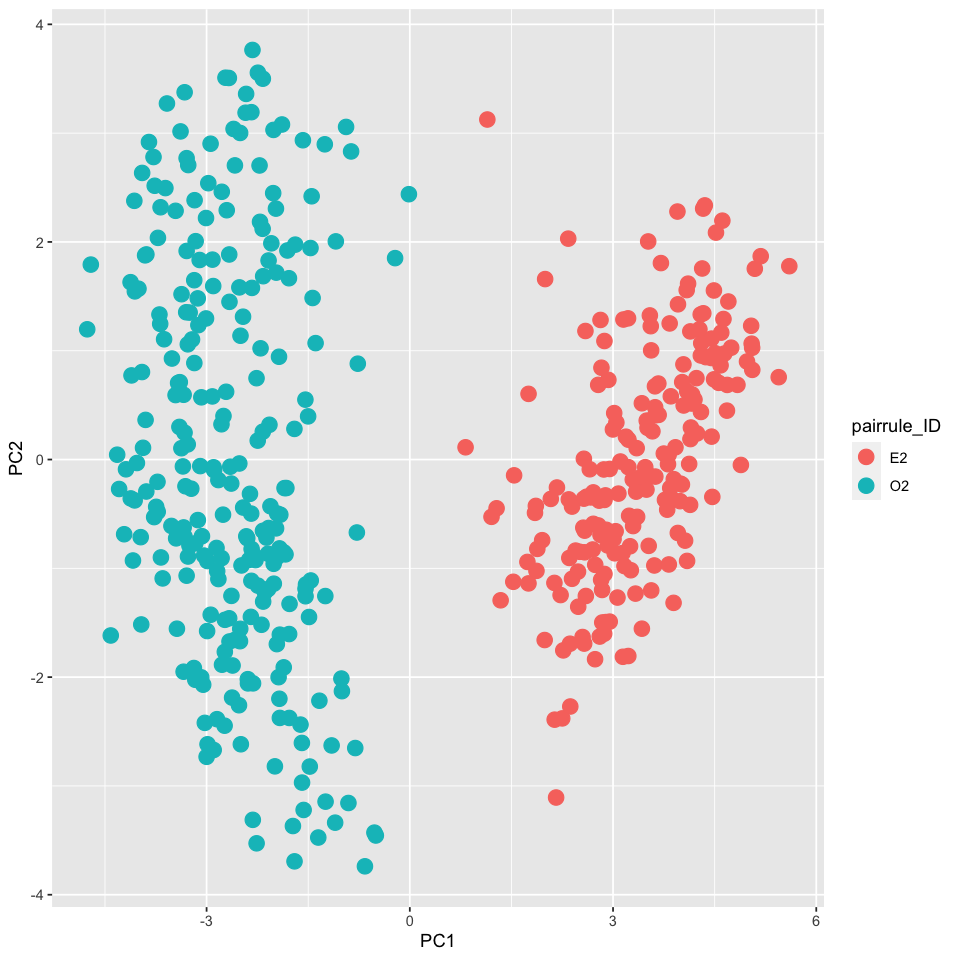

Saving 7 x 7 in image



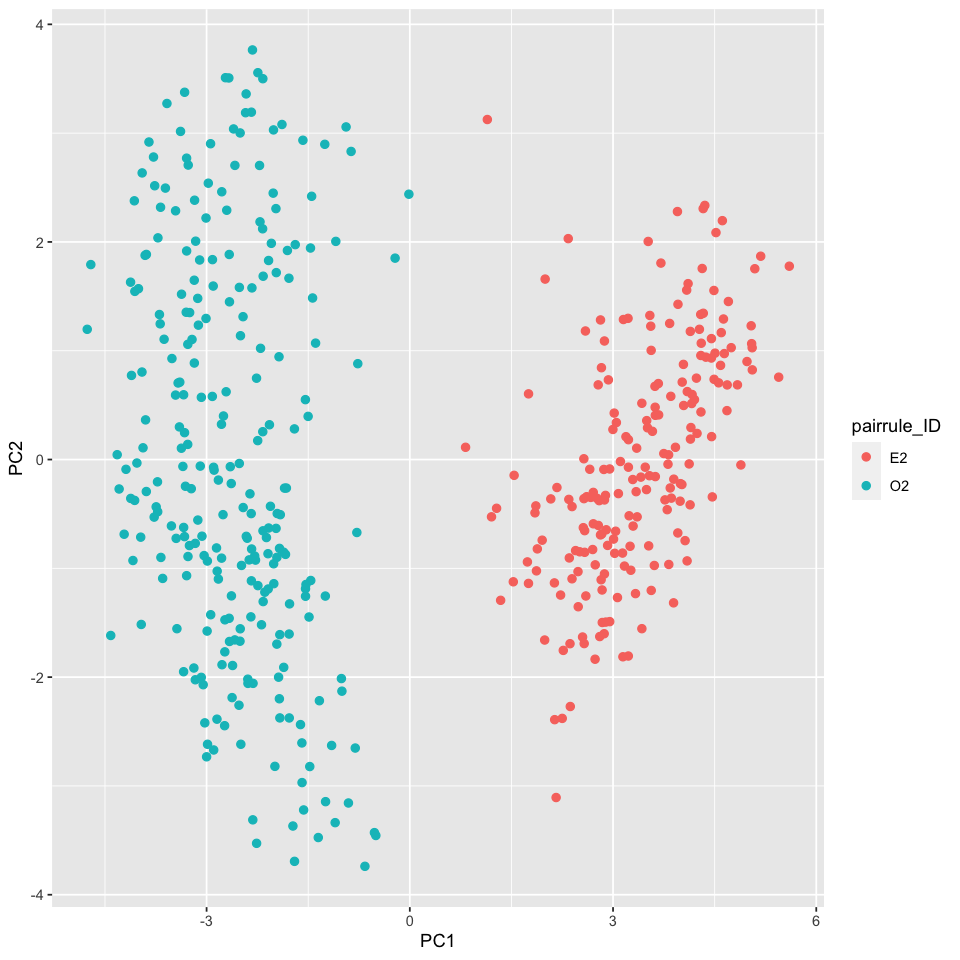

In [68]:
ggplot(pca_col2,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 4)  
fig <- ggplot(pca_col2,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 2)  
fig
ggsave(fig, file = "./figures/PR_assignment_col2_1.eps", dpi = 300)

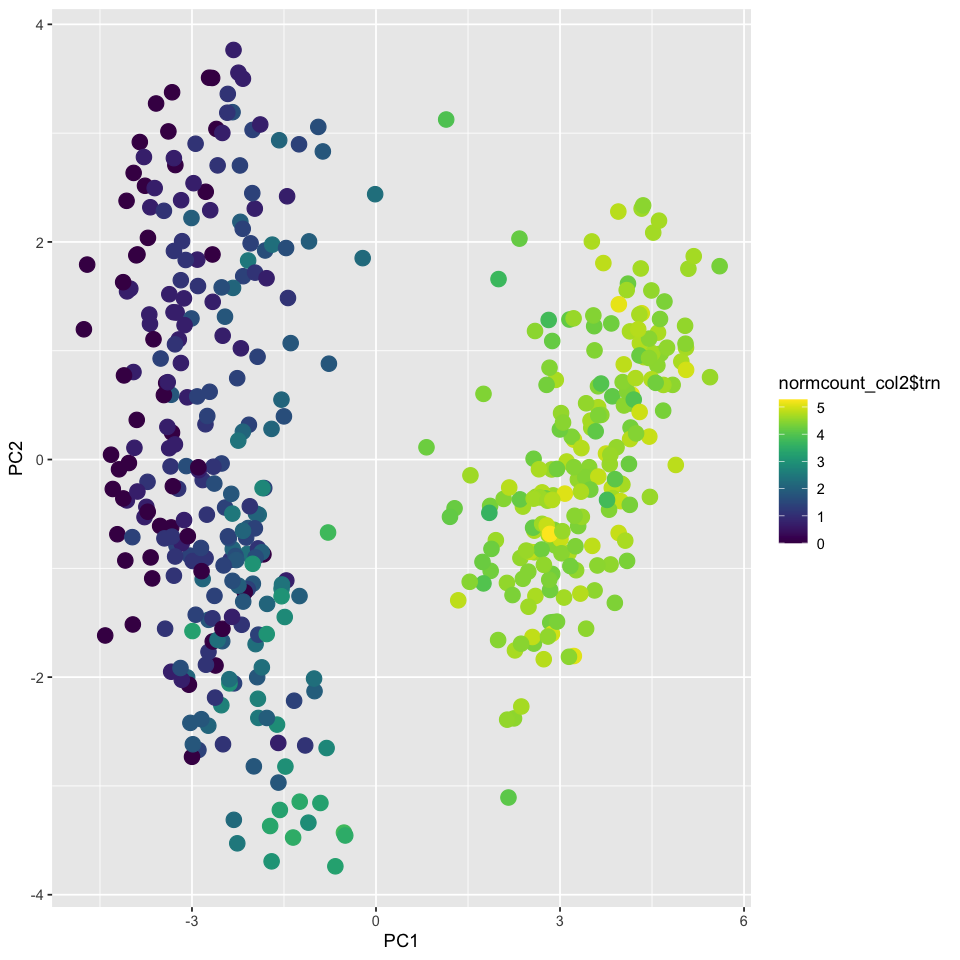

In [69]:
ggplot(pca_col2,　aes(x=PC1,y=PC2 ,col = normcount_col2$trn))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

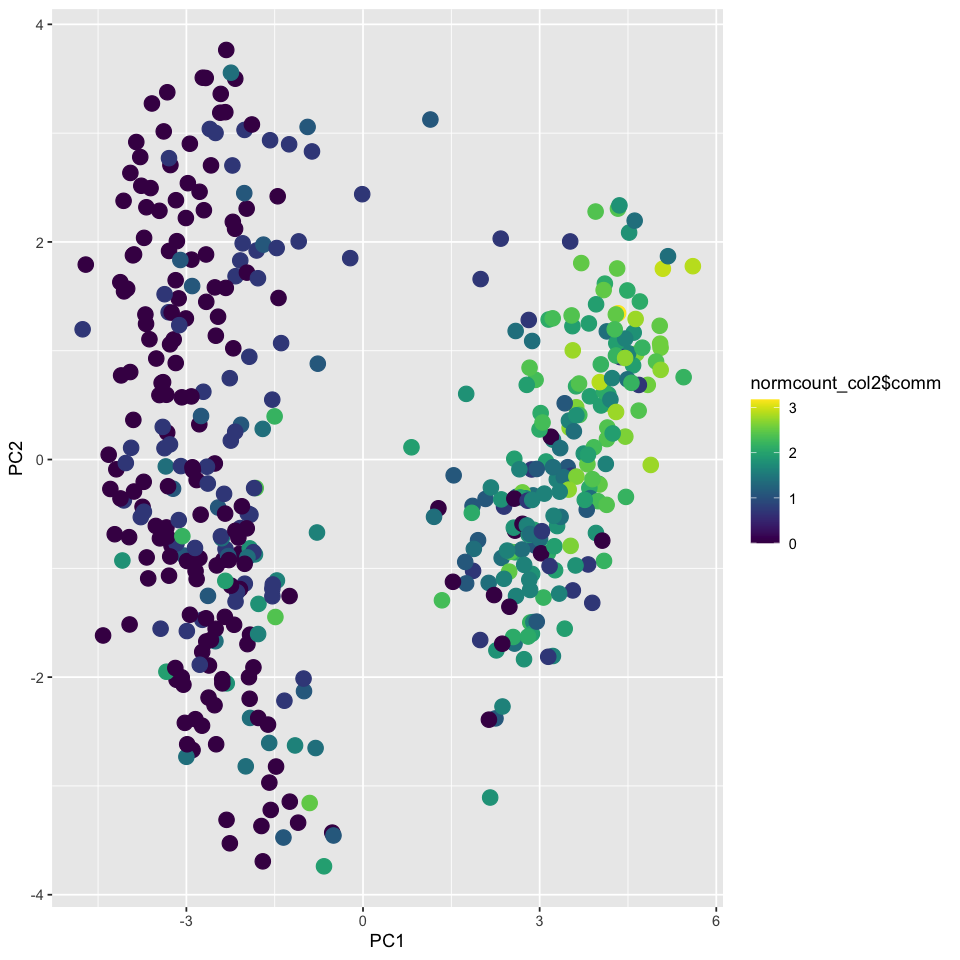

In [70]:
ggplot(pca_col2,　aes(x=PC1,y=PC2 ,col = normcount_col2$comm))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

### Col3 (slp1+, wg-)

In [71]:
normcount_col3 <- as.data.frame(t(normcount_lateralect[, celllist_PR3]))
head(normcount_col3)
dim(normcount_col3)


,sog,Abd-B,salm,trn,ind,Atx-1,bnl,stg,Dll,eve,⋯,Xbp1,asRNA:CR45145,T48,CaBP1,PlexA,CG32767,Pkc98E,Sr-CIV,B4,CG13640
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAAGAACGTGGCTACC,2.772589,1.098612,1.9459101,4.0430513,0.000000,2.197225,0,2.079442,0,1.3862944,⋯,2.079442,0.0000000,1.098612,2.944439,1.609438,2.484907,0,0,0.0000000,0
AAAGTCCAGACGACTG,3.044522,0.000000,0.0000000,0.0000000,0.000000,3.784190,0,0.000000,0,0.0000000,⋯,0.000000,0.0000000,2.197225,2.484907,2.484907,1.791759,0,0,0.0000000,0
AAAGTCCGTGAATGTA,1.791759,0.000000,0.6931472,4.3694479,0.000000,3.637586,0,0.000000,0,0.0000000,⋯,1.098612,0.0000000,1.098612,3.178054,1.945910,1.945910,0,0,0.0000000,0
AAATGGAAGCTAATGA,0.000000,0.000000,0.0000000,0.0000000,0.000000,4.025352,0,3.806662,0,0.6931472,⋯,1.386294,0.0000000,1.609438,2.639057,1.386294,1.098612,0,0,1.0986123,0
AACAAGAAGTGGAAGA,2.197225,0.000000,0.6931472,1.7917595,0.000000,2.484907,0,1.609438,0,1.0986123,⋯,1.945910,0.0000000,1.098612,2.890372,1.098612,1.098612,0,0,0.0000000,0
AACACACCAATCGAAA,4.110874,0.000000,0.0000000,0.6931472,3.713572,1.386294,0,1.791759,0,0.0000000,⋯,1.098612,0.6931472,1.098612,2.890372,1.098612,1.609438,0,0,0.6931472,0


[1]  383 1000

In [72]:
corr_col3 <- correlate(normcount_col3)　

Warning message in stats::cor(x = x, y = y, use = use, method = method):
“ 標準偏差が 0 です ”

Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




In [73]:
corr_col3_pxb <- focus(corr_col3, "pxb")
corr_col3_pxb <- na.omit(corr_col3_pxb)
corr_col3_pxb[order(-corr_col3_pxb$pxb), ]

term,pxb
<chr>,<dbl>
trn,0.8346115
pri,0.6685583
dpn,0.6633547
CG10479,0.6541298
Ppa,0.5827547
5-HT2A,0.5761216
Best1,0.5127195
CG4702,0.5046640
h,0.5009506


In [74]:
corr_col3_pxb <- corr_col3_pxb[corr_col3_pxb$pxb >0.35 | corr_col3_pxb$pxb < -0.35, ]
dim(corr_col3_pxb)

[1] 28  2

In [75]:
normcount_col3_pxb_corr <- normcount_col3[, c("pxb", corr_col3_pxb$term) ]
head(normcount_col3_pxb_corr)
dim(normcount_col3_pxb_corr)

,pxb,trn,pri,ImpL2,CG4702,Ubx,Toll-6,halo,ich,Obp99a,⋯,crb,Pino,sad,Alh,rst,pigs,Ppa,lncRNA:noe,Best1,lncRNA:CR43849
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAAGAACGTGGCTACC,1.0986123,4.0430513,2.708050,3.401197,2.5649494,0.0000000,1.945910,0.0000000,1.0986123,1.386294,⋯,2.197225,2.484907,0.0000000,1.0986123,0.0000000,1.0986123,2.197225,1.6094379,1.6094379,0
AAAGTCCAGACGACTG,0.0000000,0.0000000,0.000000,4.219508,0.0000000,1.0986123,3.761200,1.6094379,1.3862944,3.178054,⋯,1.609438,2.302585,0.6931472,0.0000000,0.0000000,0.0000000,2.197225,0.0000000,0.0000000,0
AAAGTCCGTGAATGTA,2.1972246,4.3694479,1.386294,3.091042,0.6931472,3.4657359,1.609438,0.6931472,0.0000000,1.098612,⋯,2.079442,2.484907,0.0000000,0.6931472,0.0000000,0.0000000,2.079442,1.7917595,1.3862944,0
AAATGGAAGCTAATGA,0.0000000,0.0000000,1.098612,4.644391,0.0000000,1.9459101,3.044522,0.6931472,1.3862944,1.098612,⋯,2.197225,2.833213,0.0000000,0.0000000,0.6931472,0.0000000,2.397895,0.6931472,0.6931472,0
AACAAGAAGTGGAAGA,0.6931472,1.7917595,1.098612,3.951244,0.0000000,0.6931472,2.995732,2.0794415,0.6931472,1.386294,⋯,1.609438,2.484907,1.0986123,0.6931472,0.0000000,0.6931472,2.564949,1.0986123,0.0000000,0
AACACACCAATCGAAA,0.6931472,0.6931472,0.000000,3.931826,0.0000000,1.0986123,3.135494,1.9459101,1.0986123,0.000000,⋯,2.397895,2.302585,0.0000000,0.6931472,0.0000000,0.6931472,1.609438,1.0986123,0.0000000,0


[1] 383  29

In [76]:
set.seed(256) 
kmean_col3 <- kmeans(x=normcount_col3_pxb_corr, centers=2)

In [77]:
kmean_col3

K-means clustering with 2 clusters of sizes 189, 194

Cluster means:
        pxb      trn       pri    ImpL2    CG4702      Ubx   Toll-6      halo
1 0.2808771 1.432425 0.4728594 3.862017 0.1521093 1.266148 2.785818 1.3781725
2 2.3693560 4.299166 2.3337698 2.931558 1.2334065 2.382191 1.520331 0.6028809
        ich    Obp99a       18w      Cys   CG10479       dpn       nub
1 1.7909278 1.3747360 1.4213150 4.845440 0.5928973 0.1213731 0.2482313
2 0.1586974 0.5233211 0.3569484 4.383181 1.8428964 1.2565661 0.9159263
          h     slp2    5-HT2A     blot      crb     Pino       sad       Alh
1 0.3022048 0.485440 0.7122735 1.668011 2.375727 2.499935 0.5353621 0.9181283
2 1.1816759 1.016857 1.6901375 2.381120 2.856895 1.892807 0.1601803 1.3911193
        rst      pigs      Ppa lncRNA:noe     Best1 lncRNA:CR43849
1 0.5063495 0.3825296 2.096944  0.5940975 0.6286675    0.007334891
2 0.1125820 0.8504617 2.701761  1.0783825 1.3195447    0.294806940

Clustering vector:
AAAGAACGTGGCTACC AAAGTCCAGACG

In [78]:
col3_ID <- as.data.frame(kmean_col3$cluster)
colnames(col3_ID) <- c("pairrule_ID")
head(col3_ID)

,pairrule_ID
,<int>
AAAGAACGTGGCTACC,2
AAAGTCCAGACGACTG,1
AAAGTCCGTGAATGTA,2
AAATGGAAGCTAATGA,1
AACAAGAAGTGGAAGA,1
AACACACCAATCGAAA,1


In [79]:
col3_ID$pairrule_ID <- gsub("1", "O3", col3_ID$pairrule_ID) 
col3_ID$pairrule_ID <- gsub("2", "E3", col3_ID$pairrule_ID) 
head(col3_ID)

,pairrule_ID
,<chr>
AAAGAACGTGGCTACC,E3
AAAGTCCAGACGACTG,O3
AAAGTCCGTGAATGTA,E3
AAATGGAAGCTAATGA,O3
AACAAGAAGTGGAAGA,O3
AACACACCAATCGAAA,O3


In [80]:
pca_col3<-prcomp(normcount_col3_pxb_corr)
head(pca_col3)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC20,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29
pxb,0.34350651,-0.015701293,0.003584440,-0.069330110,0.148345985,-0.049592364,0.106291627,-0.034512036,-0.059283117,-0.240058055,⋯,0.07979877,0.049701834,-0.3245902857,-0.117096680,-0.432759585,0.434220932,0.08228187,0.416860296,-0.140193362,0.084193872
trn,0.47993987,-0.210830134,0.050644076,-0.179967685,-0.135359608,-0.374996907,0.053310304,-0.336196326,-0.366257581,0.184534524,⋯,-0.07286983,0.017048049,0.2462228033,-0.064485871,0.006986059,-0.087683863,-0.17575792,0.011323548,0.051251968,0.042763845
pri,0.31762768,-0.193406306,-0.449778447,0.013856989,0.266986778,0.504888856,-0.090502207,0.199474637,-0.155957672,0.274712353,⋯,0.07647320,-0.118776541,-0.0540508540,-0.061314170,0.013876988,-0.046896823,0.02796789,-0.075540431,0.024737975,-0.120891372
ImpL2,-0.17476152,-0.293934473,-0.004866179,0.268557373,0.626340869,-0.121968947,0.249121620,-0.204626151,-0.018397305,0.056879969,⋯,0.19143551,-0.024958938,0.0210366279,0.203255636,-0.133330668,-0.030970014,-0.04095408,-0.035093463,0.035578392,0.046247471
CG4702,0.17784357,-0.113728220,-0.384669799,0.044839430,-0.122247563,0.108033565,0.173744036,-0.076579522,0.404684939,0.189579971,⋯,-0.33533494,0.020281613,0.0417204922,0.020270037,0.044450224,0.020314495,-0.06372038,0.042662122,-0.030327649,0.012016831
Ubx,0.19528257,0.055558624,0.714954023,0.052093960,0.139377299,0.263774310,0.281240811,0.265919277,-0.033376281,0.286918083,⋯,-0.13770065,-0.082173597,-0.0101249507,-0.089190633,0.071077811,-0.066036728,-0.02422150,0.030736567,-0.012175104,-0.058060165
Toll-6,-0.21104806,-0.615371877,0.162095358,-0.372723048,-0.184837296,0.152886866,-0.147065785,0.005157046,0.190534935,-0.084645718,⋯,-0.07629338,-0.169052639,-0.1488129106,-0.010657842,-0.088627141,0.058980576,-0.04390832,0.005852150,-0.014426332,0.024224813
halo,-0.13366769,-0.011644783,0.026052729,-0.284194867,0.100251827,0.224082899,-0.307710406,-0.167546821,-0.411051397,-0.070394162,⋯,0.20923815,0.087087331,0.1264604526,0.010612673,0.063057852,0.017054815,0.01789818,-0.046034184,0.036841230,0.025053665
ich,-0.27141594,0.232605493,-0.163009314,-0.353369899,0.307634046,-0.066895746,0.088993099,0.072586122,-0.139749176,0.049732522,⋯,-0.53277384,-0.068698249,0.1791922561,-0.098577923,-0.061719856,0.191789196,-0.17194003,0.049147693,-0.044025257,-0.019787266
Obp99a,-0.14294649,-0.160993750,-0.075009738,0.161653451,0.108757152,-0.455046863,-0.255053600,0.564080485,-0.050907042,0.193801115,⋯,0.10628894,-0.007831560,0.0138093172,-0.084762828,-0.003043852,0.005822488,-0.05298987,0.009417046,0.026652305,0.084182001


In [81]:
pca_col3 <- as.data.frame(pca_col3$x)
pca_col3$pairrule_ID <- col3_ID$pairrule_ID
head(pca_col3)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,pairrule_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAAGAACGTGGCTACC,1.619171,-0.7610328,-2.92071536,-0.48845767,-0.001297846,-0.9745012,0.2220119,0.5907531,0.6979749,0.3491730,⋯,-0.0680648522,0.87951564,-0.46545600,0.62262416,-0.27808461,-0.05651912,0.25007606,-0.09399946,0.2680618,E3
AAAGTCCAGACGACTG,-4.513953,-1.3626195,0.04117496,1.23018413,-0.879528236,-0.1496860,-0.4686306,1.9612124,-0.1940984,-0.3856495,⋯,0.7801607460,-0.01136344,0.08832048,-0.29992789,0.36696146,0.03608799,-0.07597784,-0.06492513,-0.1555221,O3
AAAGTCCGTGAATGTA,2.295330,-0.5069364,1.15604312,0.03359808,-0.403280993,-1.0867145,0.7677041,0.6069942,-0.1901622,0.5415222,⋯,0.2365934854,-0.63431184,-0.22681871,0.56107156,-0.32164919,0.22381403,0.52615152,-0.15152836,0.3172714,E3
AAATGGAAGCTAATGA,-3.519616,0.5497878,-0.06503954,0.30568016,0.650740485,0.7441382,1.0367560,0.8982594,0.8856286,-0.0877616,⋯,0.0009425175,-1.01287085,0.49646193,0.33816790,-0.10801844,0.04529085,-0.25160332,0.01703333,-0.1047487,O3
AACAAGAAGTGGAAGA,-2.532327,-1.0735481,-0.28942465,-0.29528981,-0.521193567,0.1960309,-0.5047901,0.1802773,-0.6929068,0.3167927,⋯,0.7389879184,-0.61855170,0.07562349,-0.02008710,0.21841900,-0.47822211,-0.01129526,0.06802143,0.0790878,O3
AACACACCAATCGAAA,-3.204581,0.2487695,0.35363493,-0.48056644,-0.249274775,0.7696597,0.3391419,-0.9862134,0.7010453,-0.1775516,⋯,0.7294582089,-0.33356424,0.33240907,-0.02385014,-0.06378411,0.45946261,0.42439120,-0.01733908,0.4279818,O3


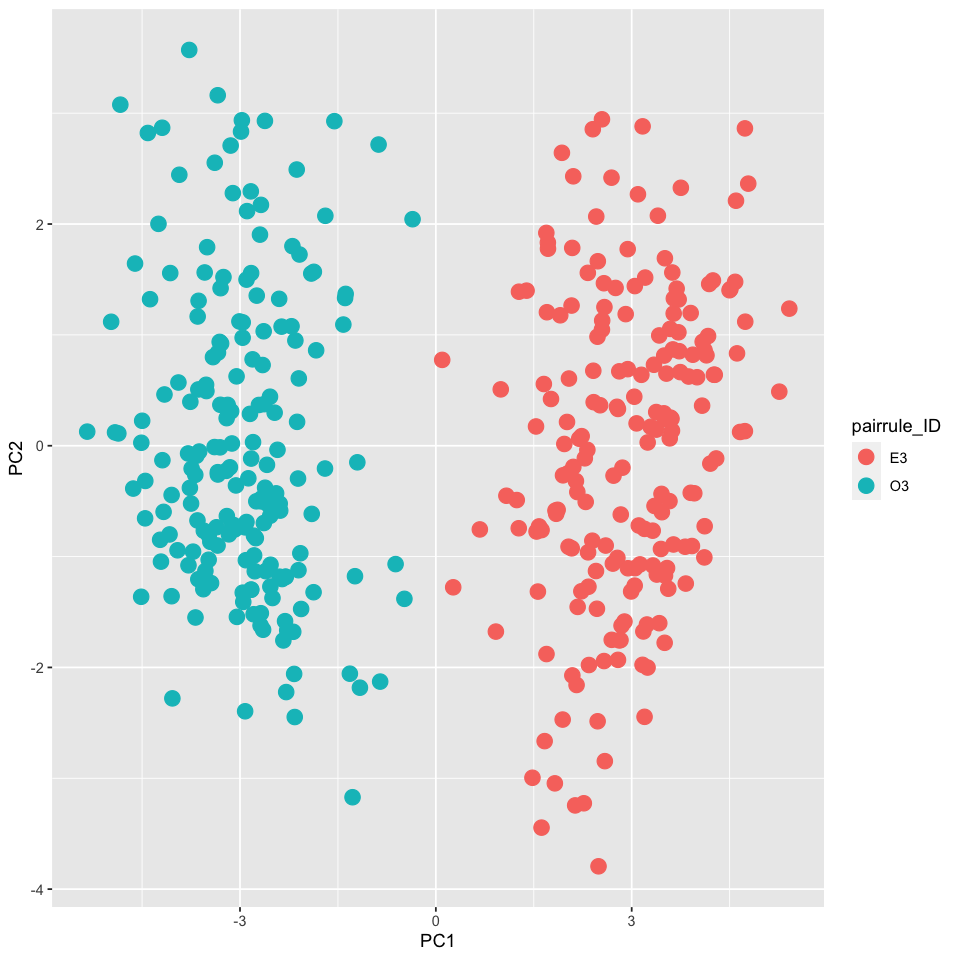

Saving 7 x 7 in image



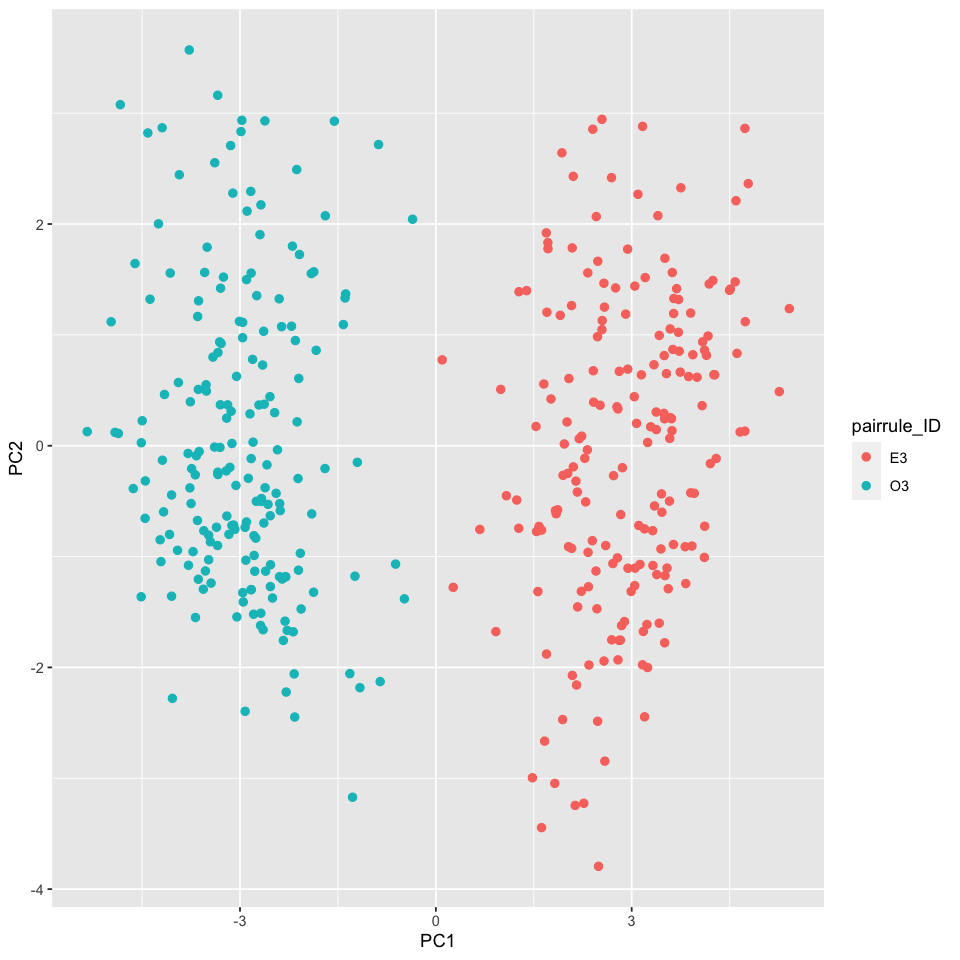

In [82]:
ggplot(pca_col3,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 4)  
fig <- ggplot(pca_col3,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 2)  
fig
ggsave(fig, file = "./figures/PR_assignment_col3_1.eps", dpi = 300)

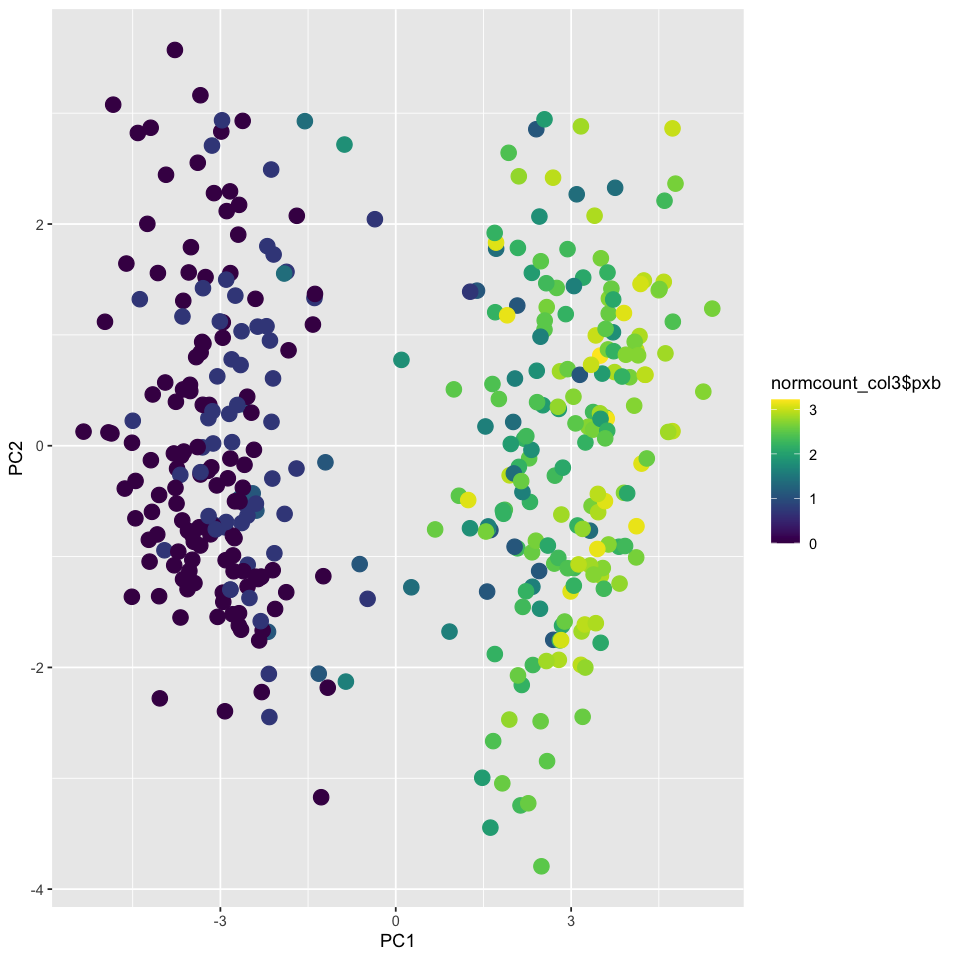

In [83]:
ggplot(pca_col3,　aes(x=PC1,y=PC2 ,col = normcount_col3$pxb))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

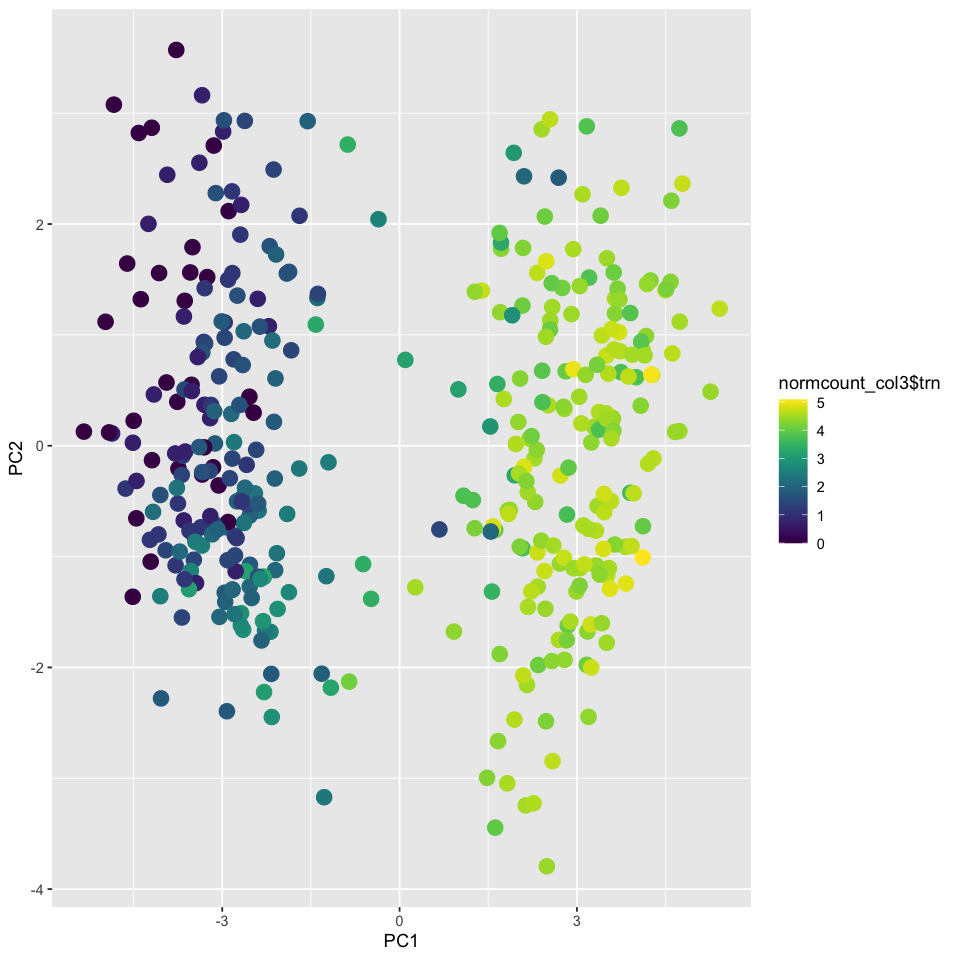

In [84]:
ggplot(pca_col3,　aes(x=PC1,y=PC2 ,col = normcount_col3$trn))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

### Col4 (wg+)

In [85]:
normcount_col4 <- as.data.frame(t(normcount_lateralect[, celllist_PR4]))
head(normcount_col4)
dim(normcount_col4)

,sog,Abd-B,salm,trn,ind,Atx-1,bnl,stg,Dll,eve,⋯,Xbp1,asRNA:CR45145,T48,CaBP1,PlexA,CG32767,Pkc98E,Sr-CIV,B4,CG13640
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCACAGGGAGAG,4.8828019,0.00000,1.0986123,4.158883,0.000000,1.098612,1.386294,0.6931472,0.0000000,0.0000000,⋯,1.3862944,0,1.3862944,2.944439,1.609438,1.6094379,0,0,0.000000,0
AAACGAAAGACATAGT,4.3174881,0.00000,0.0000000,3.871201,0.000000,0.000000,0.000000,0.0000000,0.0000000,1.6094379,⋯,0.6931472,0,0.6931472,2.484907,1.386294,0.6931472,0,0,0.000000,0
AAAGGATAGGCTGAAC,4.9487599,0.00000,1.0986123,2.772589,2.397895,1.098612,0.000000,1.0986123,0.6931472,1.0986123,⋯,0.6931472,0,1.3862944,3.465736,1.945910,2.3978953,0,0,0.000000,0
AAAGTCCCAGGTTACT,0.6931472,0.00000,0.6931472,1.609438,1.609438,2.639057,0.000000,1.9459101,0.0000000,1.7917595,⋯,0.6931472,0,0.0000000,3.135494,1.945910,2.5649494,0,0,0.000000,0
AAAGTCCGTAAGACCG,4.7361984,0.00000,0.0000000,2.772589,0.000000,0.000000,0.000000,0.0000000,0.0000000,0.6931472,⋯,0.6931472,0,1.3862944,2.639057,1.609438,1.6094379,0,0,1.098612,0
AACACACGTCGTATTG,2.9957323,1.94591,0.0000000,1.386294,0.000000,2.302585,0.000000,1.3862944,0.0000000,0.0000000,⋯,1.3862944,0,1.3862944,2.564949,1.098612,1.7917595,0,0,0.000000,0


[1]  408 1000

In [86]:
corr_col4 <- correlate(normcount_col4)

Warning message in stats::cor(x = x, y = y, use = use, method = method):
“ 標準偏差が 0 です ”

Correlation method: 'pearson'
Missing treated using: 'pairwise.complete.obs'




In [87]:
corr_col4_pxb <- focus(corr_col4, "pxb")
corr_col4_pxb <- na.omit(corr_col4_pxb)
corr_col4_pxb[order(-corr_col4_pxb$pxb), ]

term,pxb
<chr>,<dbl>
pri,0.7346796
Alh,0.6906974
Tollo,0.6877340
trn,0.6477836
h,0.6445045
dpn,0.6333838
5-HT2A,0.5575441
lncRNA:CR43849,0.5124416
CG4702,0.4966778


In [88]:
corr_col4_pxb <- corr_col4_pxb[corr_col4_pxb$pxb >0.35 | corr_col4_pxb$pxb < -0.35, ]
dim(corr_col4_pxb)

[1] 30  2

In [89]:
normcount_col4_pxb_corr <- normcount_col4[, c("pxb", corr_col4_pxb$term) ]
head(normcount_col4_pxb_corr)
dim(normcount_col4_pxb_corr)

,pxb,trn,pri,ImpL2,CG4702,halo,ich,Obp99a,18w,Tollo,⋯,px,aay,Alh,comm2,rst,pigs,elav,osp,CG30015,lncRNA:CR43849
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACCCACAGGGAGAG,2.3025851,4.158883,2.944439,3.761200,1.609438,0.0000000,0.0000000,0.6931472,0.6931472,2.6390573,⋯,2.397895,3.526361,0.6931472,1.609438,0.0000000,1.386294,0.6931472,0.0000000,1.3862944,0
AAACGAAAGACATAGT,0.0000000,3.871201,0.000000,3.332205,0.000000,1.3862944,0.6931472,0.0000000,2.9957323,2.7725887,⋯,1.386294,2.833213,0.6931472,1.098612,0.6931472,0.000000,2.1972246,0.0000000,0.6931472,0
AAAGGATAGGCTGAAC,3.1780538,2.772589,3.295837,2.833213,3.401197,1.3862944,0.0000000,0.0000000,0.6931472,2.8332133,⋯,2.079442,1.791759,1.7917595,1.098612,0.0000000,1.098612,2.1972246,0.6931472,0.0000000,0
AAAGTCCCAGGTTACT,0.6931472,1.609438,0.000000,2.302585,0.000000,1.9459101,2.0794415,1.0986123,2.5649494,1.7917595,⋯,2.079442,1.098612,2.3978953,0.000000,0.0000000,0.000000,2.0794415,0.0000000,1.9459101,0
AAAGTCCGTAAGACCG,0.0000000,2.772589,0.000000,4.962845,0.000000,0.6931472,0.6931472,0.0000000,2.3978953,2.7725887,⋯,1.386294,2.302585,0.6931472,1.609438,1.3862944,0.000000,1.9459101,0.0000000,1.0986123,0
AACACACGTCGTATTG,0.6931472,1.386294,0.000000,3.178054,0.000000,2.3978953,3.0910425,1.7917595,2.3025851,0.6931472,⋯,1.098612,1.098612,0.0000000,1.609438,0.0000000,0.000000,1.0986123,1.0986123,2.1972246,0


[1] 408  31

In [90]:
set.seed(256) 
kmean_col4 <- kmeans(x=normcount_col4_pxb_corr, centers=2)

In [91]:
kmean_col4

K-means clustering with 2 clusters of sizes 204, 204

Cluster means:
        pxb      trn       pri    ImpL2    CG4702      halo       ich    Obp99a
1 2.7332491 3.453642 2.5479622 2.647097 0.9550794 0.9295149 0.2236654 0.6516813
2 0.2248364 1.714178 0.3884574 3.338546 0.1172566 1.6958756 1.7658115 1.3175692
       18w    Tollo      run   CG10479       dpn     comm         h       pio
1 1.414162 3.021024 1.871305 1.4581931 1.0746374 1.673693 1.2348427 0.4654722
2 2.593944 1.564180 2.730039 0.6780975 0.1192442 2.428572 0.1544941 1.0492043
        aos      slp2    5-HT2A      crb     Pino       px      aay       Alh
1 0.1905422 1.4319478 1.3972845 2.751924 1.802292 2.120472 2.157685 1.9032504
2 0.6958500 0.7501622 0.5831032 2.358920 2.504271 1.560403 1.539457 0.7543933
     comm2       rst      pigs    elav       osp   CG30015 lncRNA:CR43849
1 1.015732 0.1100675 1.0816772 1.56491 0.1186668 0.7417682      0.3928652
2 1.533881 0.6237950 0.4353717 2.00053 0.4732627 1.2300781      0.0155787



In [92]:
col4_ID <- as.data.frame(kmean_col4$cluster)
colnames(col4_ID) <- c("pairrule_ID")
head(col4_ID)

,pairrule_ID
,<int>
AAACCCACAGGGAGAG,1
AAACGAAAGACATAGT,2
AAAGGATAGGCTGAAC,1
AAAGTCCCAGGTTACT,2
AAAGTCCGTAAGACCG,2
AACACACGTCGTATTG,2


In [93]:
col4_ID$pairrule_ID <- gsub("1", "E4", col4_ID$pairrule_ID) 
col4_ID$pairrule_ID <- gsub("2", "O4", col4_ID$pairrule_ID) 
head(col4_ID)

,pairrule_ID
,<chr>
AAACCCACAGGGAGAG,E4
AAACGAAAGACATAGT,O4
AAAGGATAGGCTGAAC,E4
AAAGTCCCAGGTTACT,O4
AAAGTCCGTAAGACCG,O4
AACACACGTCGTATTG,O4


In [94]:
pca_col4<-prcomp(normcount_col4_pxb_corr)
head(pca_col4)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31
pxb,-0.40511807,-0.005289034,0.142322485,-0.138825237,1.873822e-02,-0.0350614384,9.611960e-02,-0.001731672,-0.225283854,0.069350266,⋯,-0.0244635192,-0.163831706,-0.055450291,0.0090703156,0.114859444,0.270943385,-0.127219453,-0.582206003,0.199287311,-0.2199750434
trn,-0.34087723,-0.230128401,-0.120680960,0.549418612,-1.976340e-01,0.2598877491,-6.687324e-02,-0.300184679,0.262843031,0.003281506,⋯,0.1028584744,0.066359744,-0.125169668,-0.1871941912,0.114972821,0.075622315,-0.042874119,0.010556875,-0.006097289,0.0517901508
pri,-0.38408430,-0.170477362,-0.280429874,-0.243910976,5.038969e-01,0.1912435246,8.679040e-02,0.014450982,0.103158459,0.026125036,⋯,-0.0655024739,0.021091797,0.053527909,-0.0636084974,0.025104658,-0.121940878,-0.007601754,-0.070402880,-0.027467382,0.0159412913
ImpL2,0.14891880,-0.418025647,0.062000204,-0.542902001,-2.456051e-01,0.4053972718,7.655483e-03,-0.196749122,-0.011510233,0.083078714,⋯,-0.1424441700,0.034744409,-0.026452894,0.0001426067,0.044934372,0.012473345,0.019122371,-0.030651844,0.009222105,-0.0162709315
CG4702,-0.15916460,0.042013751,-0.243874135,-0.137447288,1.723955e-01,0.0901601235,-1.269304e-01,0.226555281,0.264947926,-0.253688013,⋯,-0.1225835411,-0.134921085,-0.010973121,0.0995846873,0.162577752,0.053290917,0.003342429,0.115409897,0.044738370,0.0420782509
halo,0.13930685,-0.317924337,0.200549128,0.310356384,2.226569e-01,0.3907345764,-1.329348e-01,0.615909562,-0.141082931,-0.025568580,⋯,-0.0360451124,0.058710571,0.077958464,-0.0156859166,0.056237705,0.010140656,-0.170182560,-0.035102051,0.008154220,-0.0216870256
ich,0.27667639,0.269534906,0.050981256,-0.039506475,2.042809e-01,0.5113325464,2.613166e-01,-0.265101117,0.020851163,-0.042901126,⋯,0.4879051887,-0.166508319,0.059209580,-0.1238362883,0.071511853,0.045018037,-0.079922942,0.037226968,0.003514986,-0.0111327173
Obp99a,0.11692677,-0.121379100,-0.225651052,-0.023937196,-1.869191e-01,-0.0566615898,6.284175e-01,0.368371066,0.245564719,0.224739012,⋯,0.0397676572,0.126249634,0.056457427,0.1024613354,-0.026134259,0.046132342,0.030313876,0.008083028,-0.040371281,-0.0085947916
18w,0.22306749,-0.183982812,0.138778721,0.135228023,4.240994e-01,-0.2638703498,2.586301e-01,-0.251027510,-0.060895676,-0.015117418,⋯,-0.2270225129,-0.074035837,0.134832379,-0.0372844111,-0.011380748,-0.002896625,-0.056530748,0.097782313,0.054753926,-0.0264716980
Tollo,-0.24933684,-0.269237135,0.451651723,0.068288024,-8.477893e-02,0.0667673754,1.162154e-01,-0.101602352,0.151574698,-0.226991523,⋯,0.0003224651,-0.014989435,0.116675026,0.3610633472,-0.271909598,-0.108696594,0.259537019,0.154365300,0.135799329,0.0201436712


In [95]:
pca_col4 <- as.data.frame(pca_col4$x)
pca_col4$pairrule_ID <- col4_ID$pairrule_ID
head(pca_col4)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,⋯,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30,PC31,pairrule_ID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AAACCCACAGGGAGAG,-3.122510,-0.30856653,-0.6717829,-1.08267977,-0.2021439,0.4243709,-0.7182811,-0.84917909,1.3958252,0.53972000,⋯,0.439723783,-0.30792794,0.17084818,0.05314205,1.09060568,0.1518688,0.78249145,0.083936067,0.02555589,E4
AAACGAAAGACATAGT,1.479780,-0.94081590,0.8226568,1.21477120,-0.6065639,-0.1367839,-1.6458963,-1.11857508,0.1618751,0.12791987,⋯,-0.554600185,0.11140090,0.96245763,-0.13091197,-0.05164089,0.6361070,0.75848016,-0.005574906,0.20203291,O4
AAAGGATAGGCTGAAC,-3.081742,-0.07940897,-0.8946585,-1.43640649,0.6391160,0.5237558,-0.9971394,1.21332629,-0.2386481,-2.73164650,⋯,-0.414844807,-0.85416732,-0.09738837,-0.45353760,0.71409515,-0.3410104,-0.35810060,0.406121120,-0.46534939,E4
AAAGTCCCAGGTTACT,1.939519,1.63204811,1.3052788,1.08340045,0.8817590,0.4040578,0.1694842,-0.02210425,-0.3413741,1.16626502,⋯,0.121961716,-0.10505745,-0.55201047,-0.52683860,0.52858615,0.3244122,0.34745278,0.083325025,-0.07139818,O4
AAAGTCCGTAAGACCG,2.220143,-1.44762005,0.8346399,-0.31850888,-1.3436758,-0.1947735,-1.4761647,-1.61217447,1.0033237,0.13201193,⋯,-0.114133901,0.04264353,0.19312470,-0.31368232,0.34126587,0.4149233,0.03815360,-0.371491402,0.05210582,O4
AACACACGTCGTATTG,3.783133,0.76687502,-1.1656802,-0.03444115,-0.2179049,0.9677788,0.4652917,0.48804068,-0.8492334,-0.07390613,⋯,0.008789593,-0.13977529,-0.16069219,-0.09167959,0.08072608,-0.4963705,-0.07297938,0.626152142,-0.17066274,O4


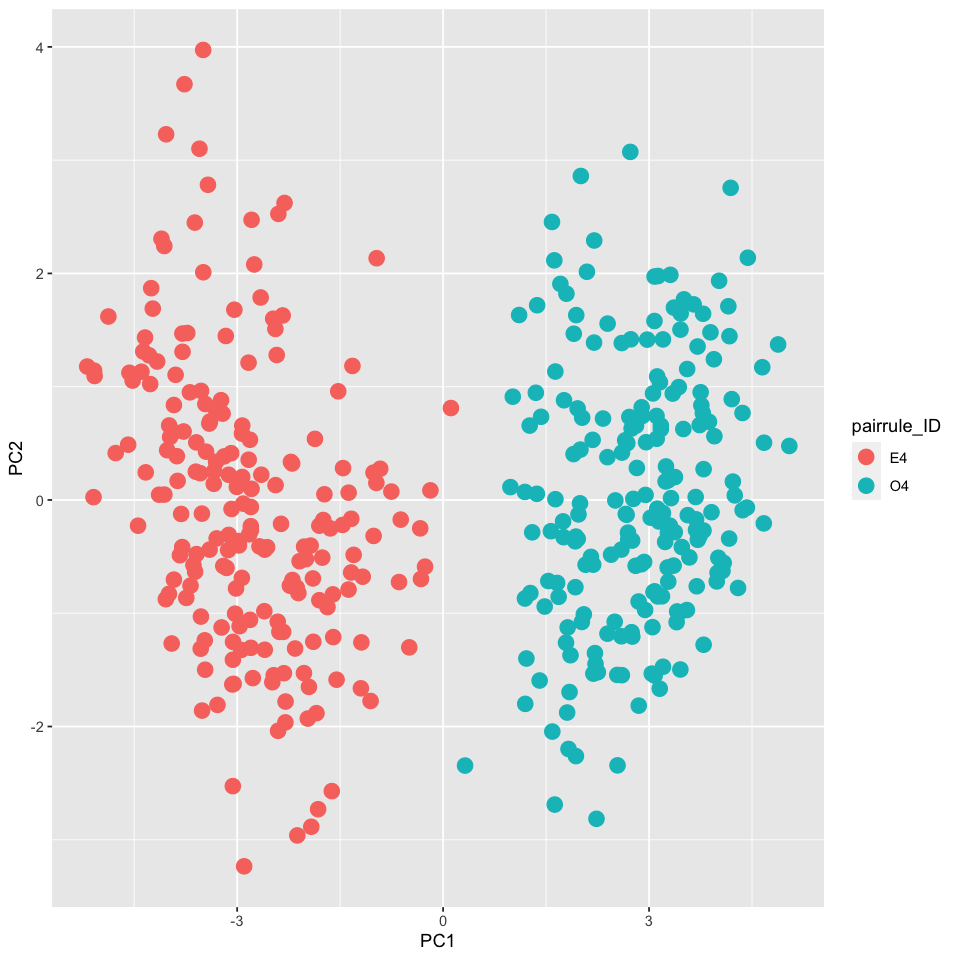

Saving 7 x 7 in image



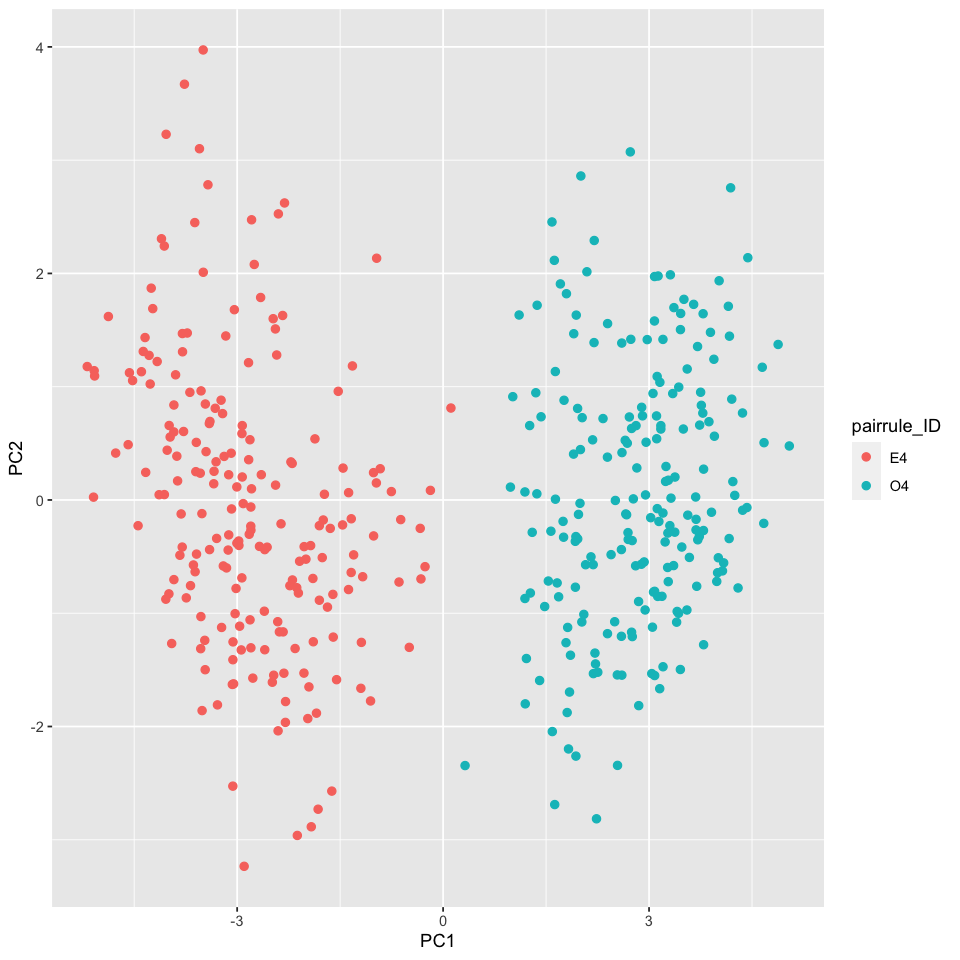

In [96]:
options(repr.plot.width=8, repr.plot.height=8)
ggplot(pca_col4,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 4) 
fig <- ggplot(pca_col4,　aes(x=PC1,y=PC2 ,col = pairrule_ID))+ geom_point(size = 2)  
fig
ggsave(fig, file = "./figures/PR_assignment_col4_1.eps", dpi = 300)

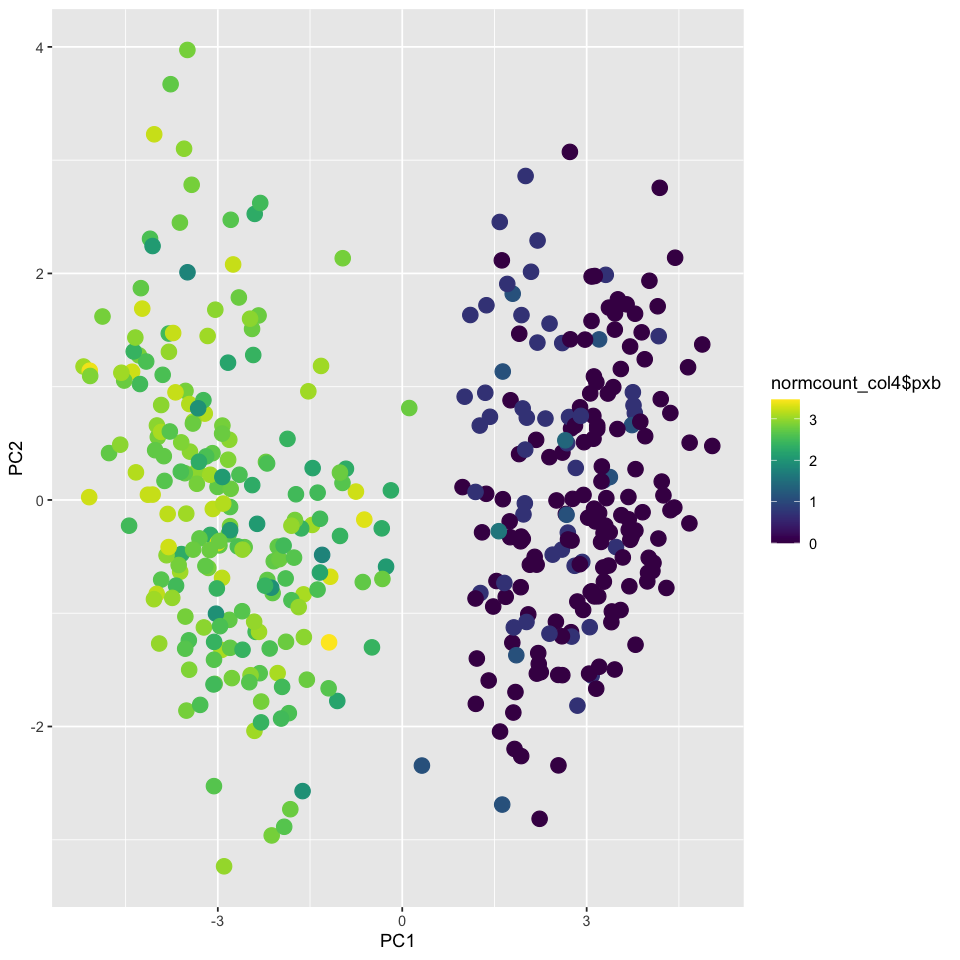

In [97]:
ggplot(pca_col4,　aes(x=PC1,y=PC2 ,col = normcount_col4$pxb))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

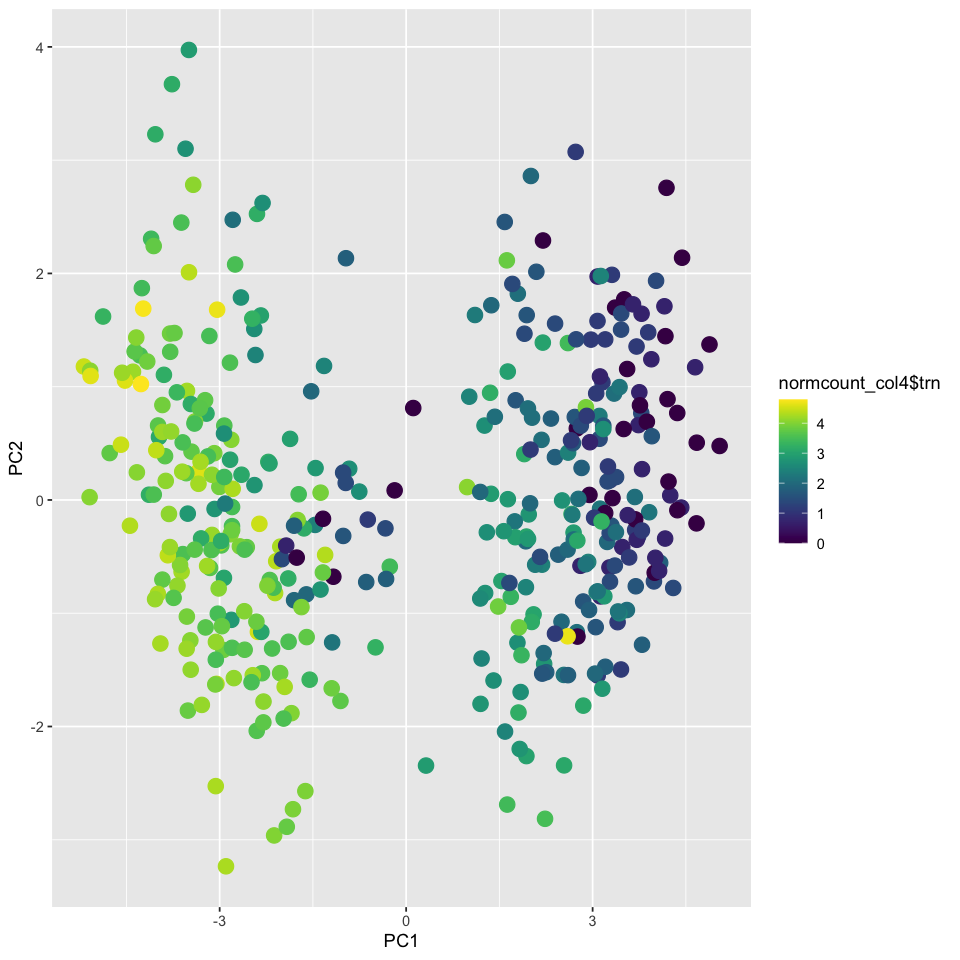

In [98]:
ggplot(pca_col4,　aes(x=PC1,y=PC2 ,col = normcount_col4$trn))+ geom_point(size = 4)    + scale_color_viridis(option = "D")

### Set annotation into seurat object

In [99]:
pairrule_ID <- rbind(col1_ID, col2_ID,col3_ID,col4_ID)
dim(pairrule_ID)
head(pairrule_ID)

[1] 1717    1

,pairrule_ID
,<chr>
AAACGCTCACAGTGAG,O1
AAACGCTTCGCGGTAC,E1
AAAGAACAGTAAGGGA,E1
AAAGTCCAGGGCAAGG,O1
AAAGTGACAGCTCTGG,O1
AACAACCGTATTTCGG,O1


In [100]:
pairrule_ID2 <- merge(data_stripe, pairrule_ID, by = 0)

In [101]:
head(pairrule_ID2)
dim(pairrule_ID2)

,Row.names,odd,prd,slp1,slp2,run,en,wg,hh,mid,pairrule_ID
,<I<chr>>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
1,AAACCCACAGGGAGAG,0.000000,1.0986123,3.0445224,1.3862944,2.5649494,0.000000,1.0986123,0.000000,0.6931472,E4
2,AAACGAAAGACATAGT,0.000000,1.0986123,3.0910425,0.6931472,2.0794415,0.000000,2.8332133,1.609438,0.0000000,O4
3,AAACGCTCACAGTGAG,1.098612,2.8332133,0.6931472,0.0000000,0.0000000,1.791759,0.6931472,2.890372,2.1972246,O1
4,AAACGCTGTACCTATG,2.079442,0.0000000,0.0000000,0.0000000,0.0000000,0.000000,0.0000000,0.000000,2.3025851,O2
5,AAACGCTGTCCGTTTC,1.791759,0.0000000,0.0000000,0.0000000,1.0986123,1.098612,0.0000000,1.386294,2.3978953,E2
6,AAACGCTTCGCGGTAC,1.386294,0.6931472,0.6931472,0.0000000,0.6931472,1.945910,0.0000000,2.564949,2.9444390,E1


[1] 1717   11

In [102]:
pairrule_ID2 <- select(pairrule_ID2, Row.names, pairrule_ID)
head(pairrule_ID2)

,Row.names,pairrule_ID
,<I<chr>>,<chr>
1,AAACCCACAGGGAGAG,E4
2,AAACGAAAGACATAGT,O4
3,AAACGCTCACAGTGAG,O1
4,AAACGCTGTACCTATG,O2
5,AAACGCTGTCCGTTTC,E2
6,AAACGCTTCGCGGTAC,E1


In [103]:
pairrule_ID2 <- pairrule_ID2 %>% column_to_rownames("Row.names")
head(pairrule_ID2)

,pairrule_ID
,<chr>
AAACCCACAGGGAGAG,E4
AAACGAAAGACATAGT,O4
AAACGCTCACAGTGAG,O1
AAACGCTGTACCTATG,O2
AAACGCTGTCCGTTTC,E2
AAACGCTTCGCGGTAC,E1


In [104]:
seu_HQC_lateralect$pairrule_ID <- pairrule_ID2
seu_HQC_lateralect

An object of class Seurat 
28745 features across 1717 samples within 2 assays 
Active assay: SCT (11239 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

In [105]:
Idents(seu_HQC_lateralect) <- "pairrule_ID"

In [106]:
levels <- c("O1","O2","O3","O4", "E1","E2","E3","E4")
levels(seu_HQC_lateralect) <- levels

In [107]:
cell.number <- table(seu_HQC_lateralect$pairrule_ID)
cell.number <- cell.number[levels]
cell.number


 O1  O2  O3  O4  E1  E2  E3  E4 
285 261 189 204 177 203 194 204 

In [108]:
PR.markers <- FindAllMarkers(object = seu_HQC_lateralect, only.pos = TRUE)

Calculating cluster O1

Calculating cluster O2

Calculating cluster O3

Calculating cluster O4

Calculating cluster E1

Calculating cluster E2

Calculating cluster E3

Calculating cluster E4



In [109]:
PR.markers.top10 <- PR.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(PR.markers.top10)

[1] 80

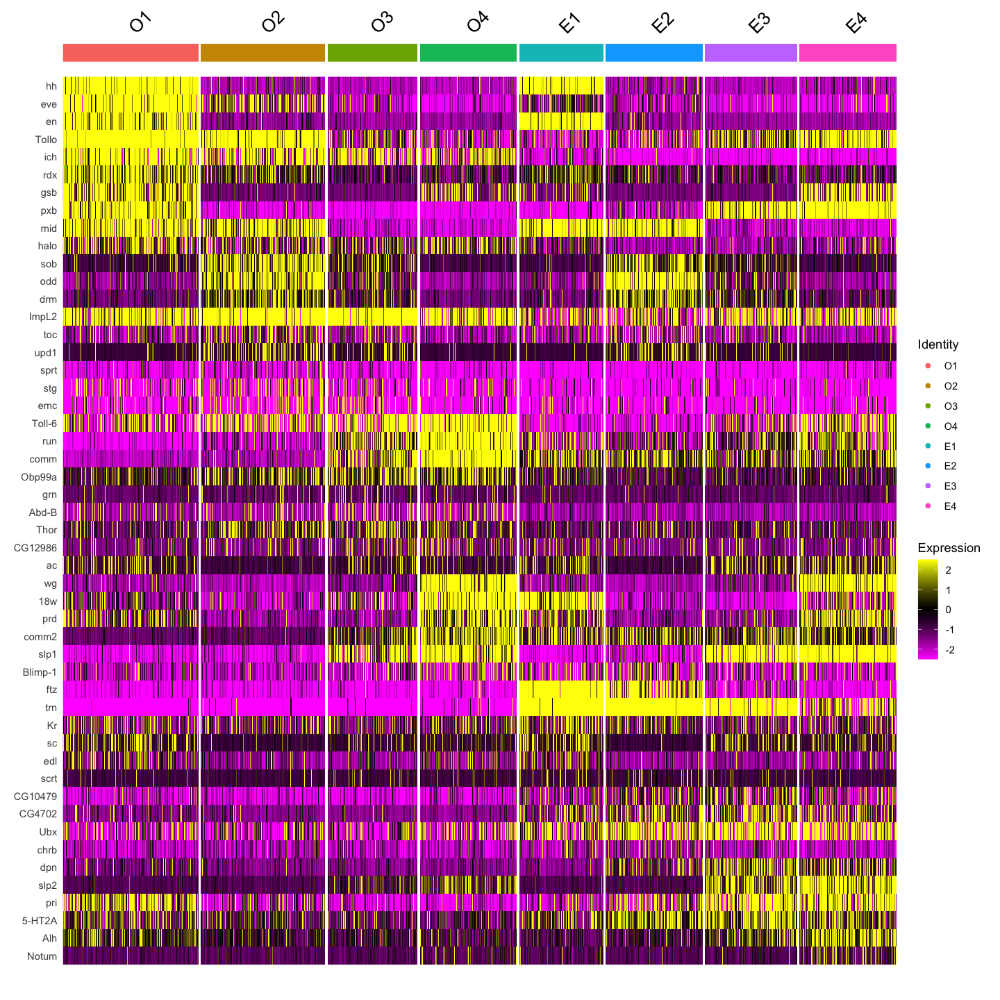

In [110]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_lateralect, features = PR.markers.top10$gene)

In [111]:
saveRDS(seu_HQC_lateralect, file = "../../data/seurat_object/Set3/seu_lateralect_PR_ID.obj")

In [112]:
write.table(seu_HQC_lateralect$pairrule_ID, file = './pair_rule_id.csv', sep = ',', col.names = F)

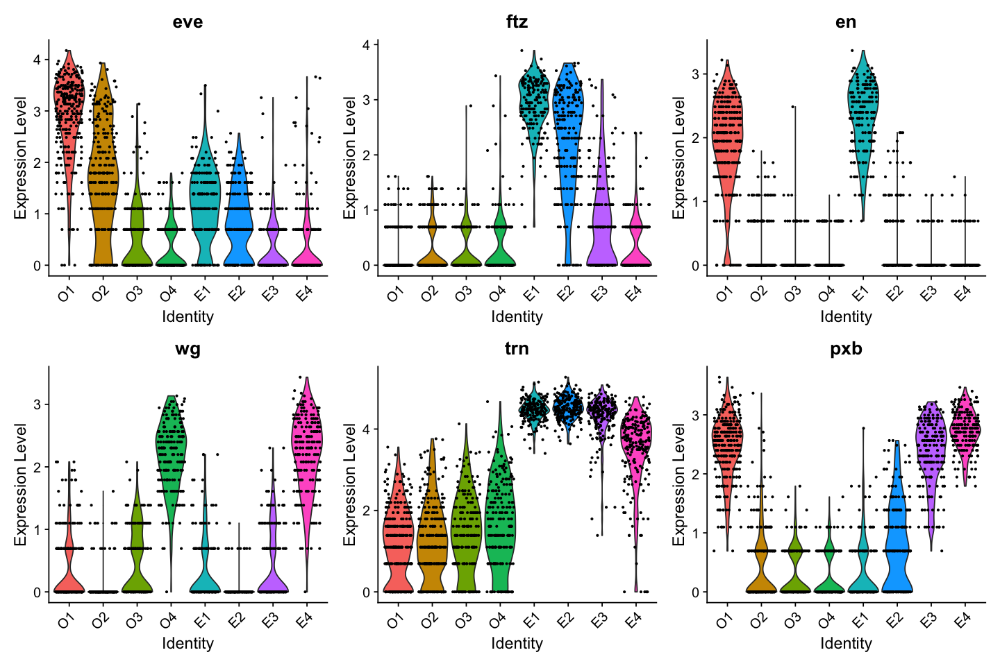

In [113]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect, features = c("eve", "ftz", "en", "wg", "trn", "pxb"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot1.pdf", width = 7.68, height = 5.12)

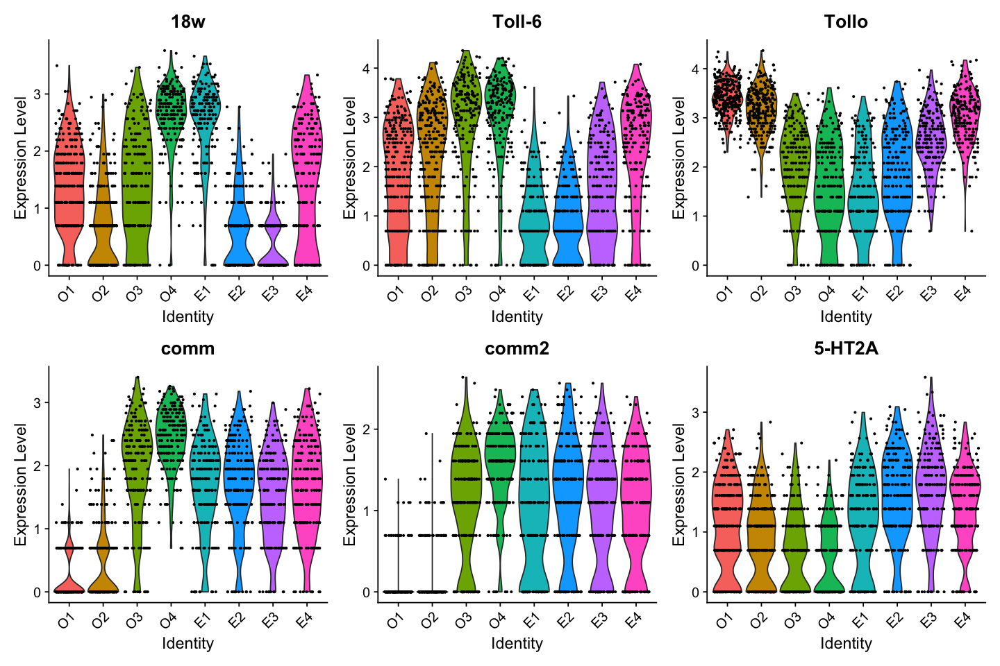

In [114]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect, features = c("18w", "Toll-6", "Tollo", "comm", "comm2", "5-HT2A"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot2.pdf", width = 7.68, height = 5.12)

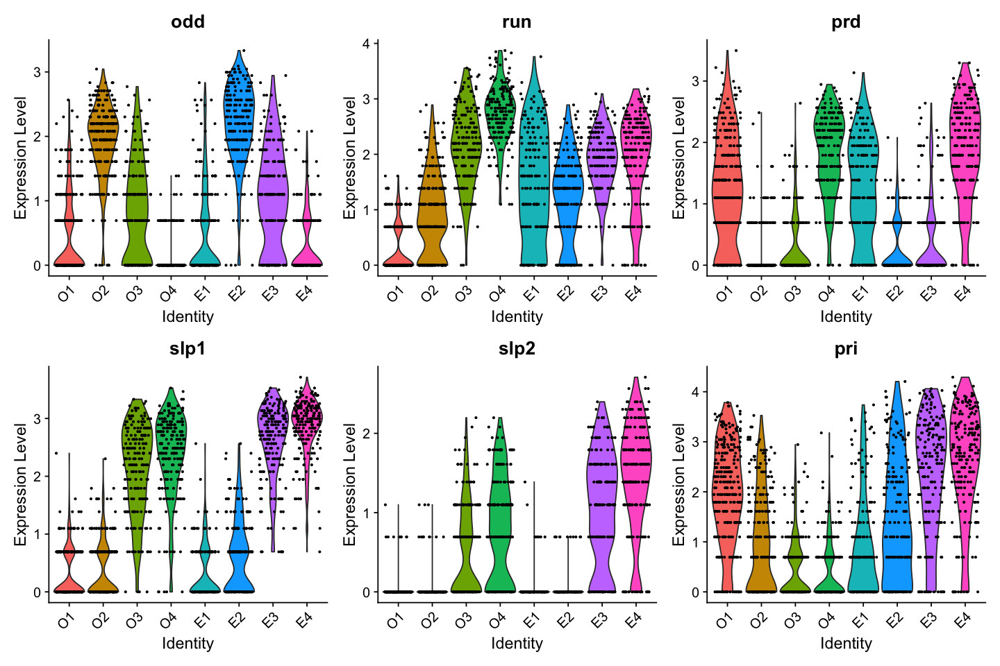

In [115]:

options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect, features = c("odd", "run", "prd", "slp1", "slp2", "pri"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot3.pdf", width = 7.68, height = 5.12)

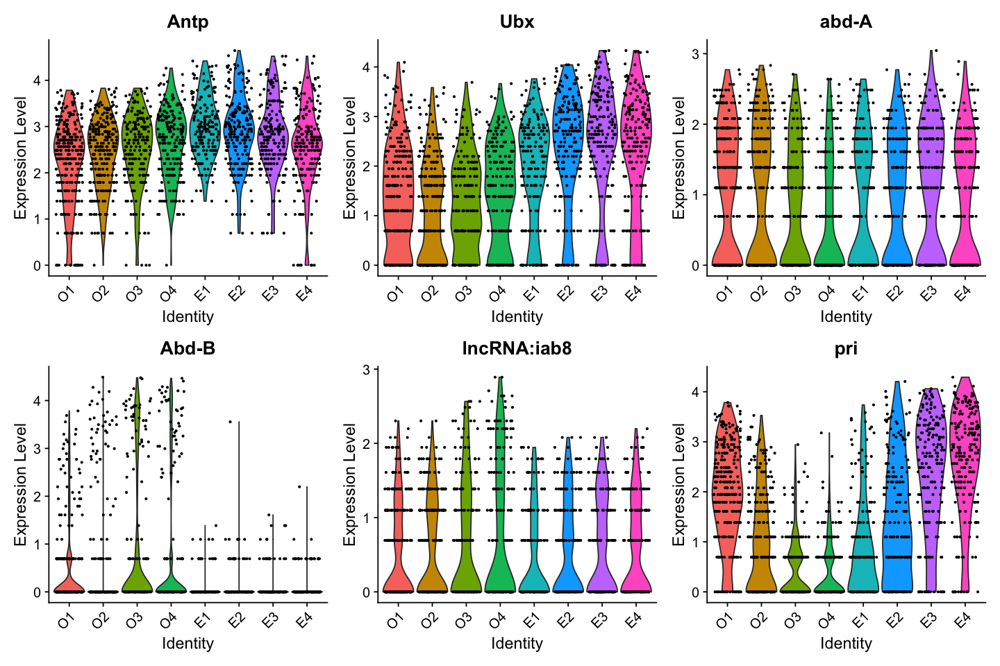

In [116]:

options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect, features = c("Antp", "Ubx", "abd-A", "Abd-B", "lncRNA:iab8", "pri"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot4.pdf", width = 7.68, height = 5.12)

In [117]:
PR_landmarks <- c('en','hh','mid',  'odd','slp1','slp2','run','prd','wg', 'trn', 'pxb')
PR_non_landmarks <- c('eve','ftz','h','gsb',  'dpn', 'pri','drm','sob','18w','Toll-6','Tollo', 'comm', 'comm2', '5-HT2A', 'Sema5c')

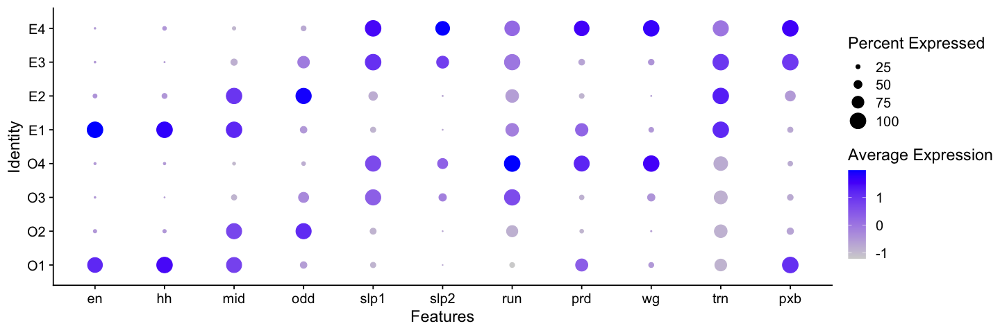

In [118]:
options(repr.plot.width=12, repr.plot.height=4)
fig <- DotPlot(object = seu_HQC_lateralect, features = PR_landmarks)
fig
ggsave(fig, file = "./figures/PR_stripe_markers_dotplot.eps", dpi = 300,  width = 12, height = 4)

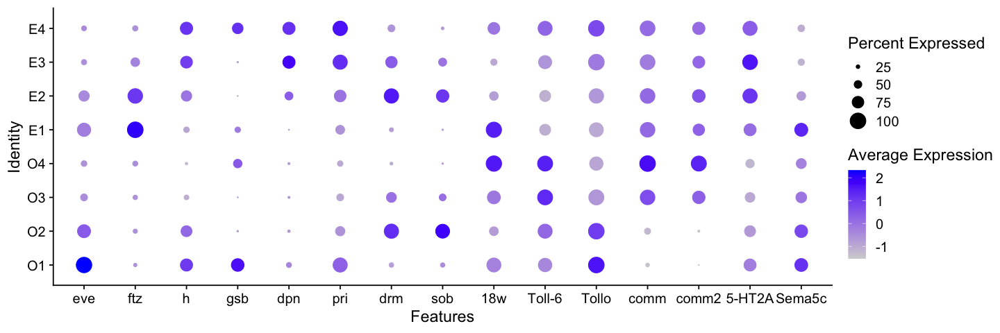

In [119]:
options(repr.plot.width=12, repr.plot.height=4)
fig <- DotPlot(object = seu_HQC_lateralect, features = PR_non_landmarks)
fig
ggsave(fig, file = "./figures/PR_stripe_nonlandmarks_dotplot.eps", dpi = 300,  width = 12, height = 4)

In [120]:
Idents(seu_HQC_lateralect) <- "manual_ID"

In [121]:
seu_HQC_lateralect2 <- subset(seu_HQC_lateralect, 
                             ident = c("ectoderm_intermediate_DE_abdominal_even", "ectoderm_intermediate_DE_abdominal_odd", 
 "ectoderm_intermediate_NE_abdominal_even", "ectoderm_intermediate_NE_abdominal_odd", 
 "ectoderm_lateral_DE_abdominal_even", "ectoderm_lateral_DE_abdominal_odd", 
 "ectoderm_lateral_NE_abdominal_even", "ectoderm_lateral_NE_abdominal_odd", 
 "ectoderm_medial_NE_abdominal_even", "ectoderm_medial_NE_abdominal_odd"))
seu_HQC_lateralect2

An object of class Seurat 
28745 features across 1582 samples within 2 assays 
Active assay: SCT (11239 features, 3000 variable features)
 1 other assay present: RNA
 3 dimensional reductions calculated: pca, umap, reumap

In [122]:
Idents(seu_HQC_lateralect2) <- "pairrule_ID"

levels <- c("O1","O2","O3","O4", "E1","E2","E3","E4")
levels(seu_HQC_lateralect2) <- levels

In [123]:
PR2.markers <- FindAllMarkers(object = seu_HQC_lateralect2, only.pos = TRUE)
PR2.markers.top10 <- PR2.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_logFC)
nrow(PR2.markers.top10)

Calculating cluster O1

Calculating cluster O2

Calculating cluster O3

Calculating cluster O4

Calculating cluster E1

Calculating cluster E2

Calculating cluster E3

Calculating cluster E4



[1] 80

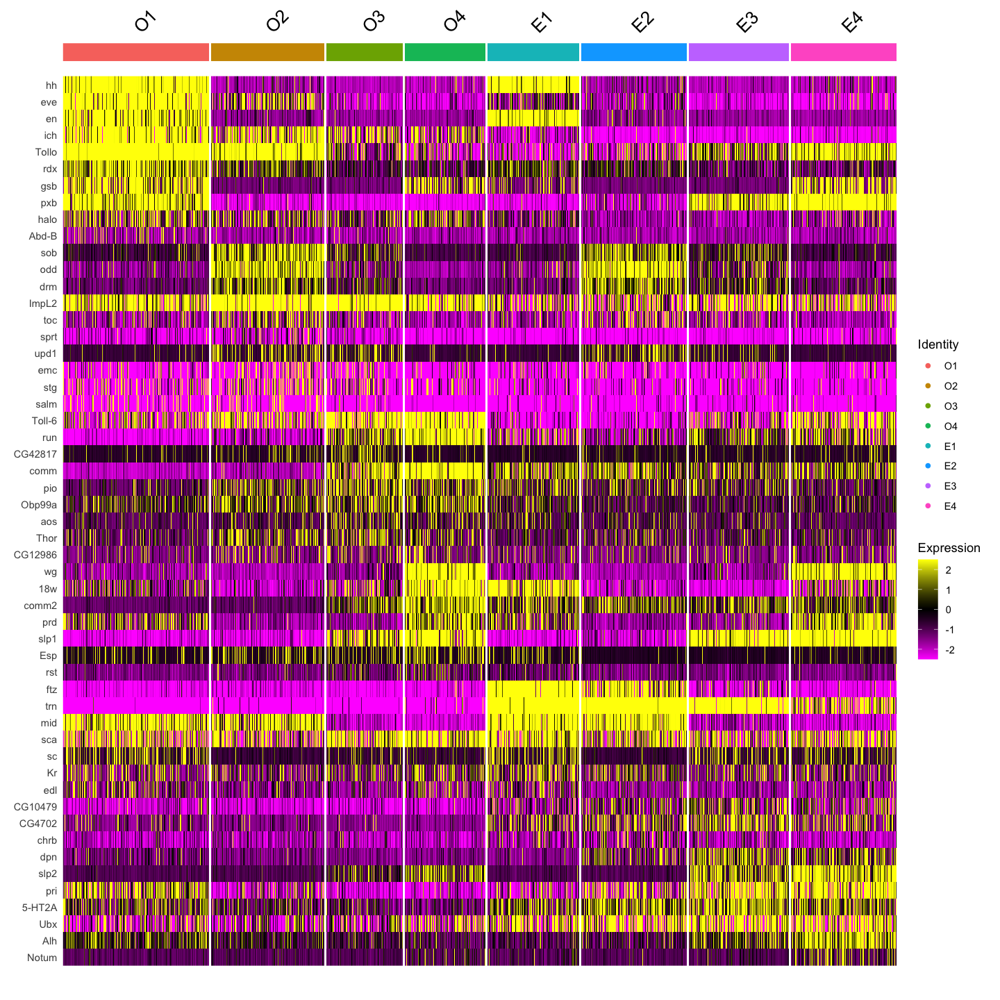

In [124]:
options(repr.plot.width=12, repr.plot.height=12)
DoHeatmap(seu_HQC_lateralect2, features = PR2.markers.top10$gene)

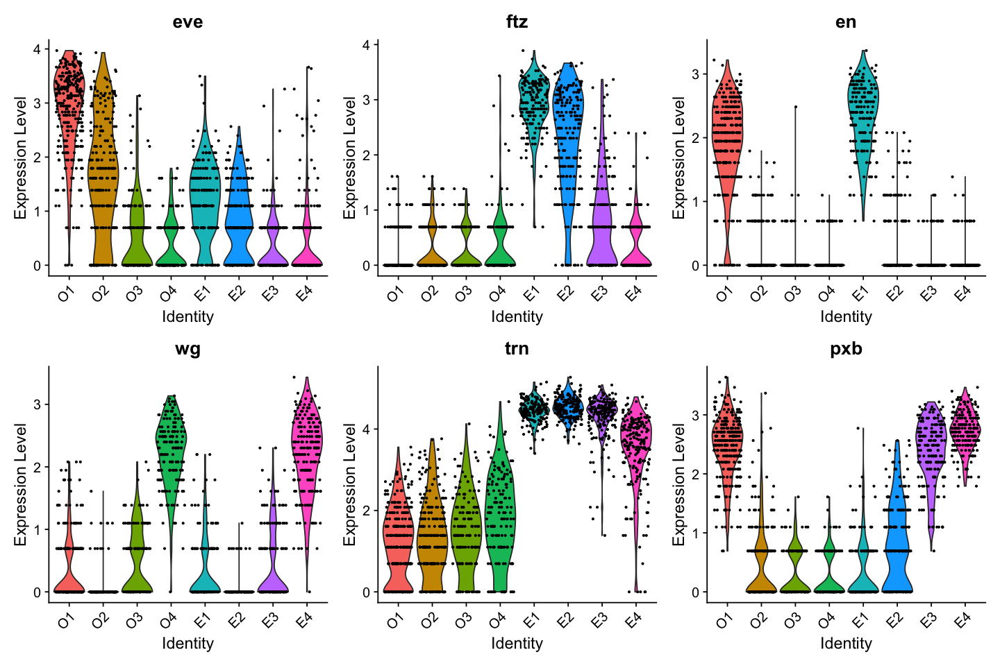

In [125]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect2, features = c("eve", "ftz", "en", "wg", "trn", "pxb"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot1_woPS13.pdf", width = 7.68, height = 5.12)

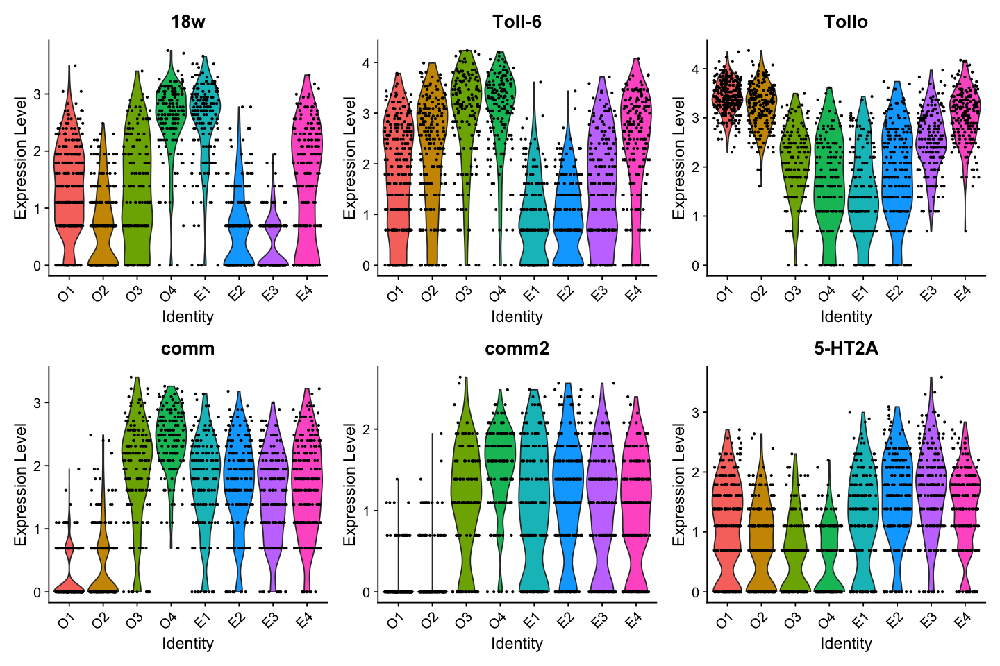

In [126]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect2, features = c("18w", "Toll-6", "Tollo", "comm", "comm2", "5-HT2A"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot2_woPS13.pdf", width = 7.68, height = 5.12)

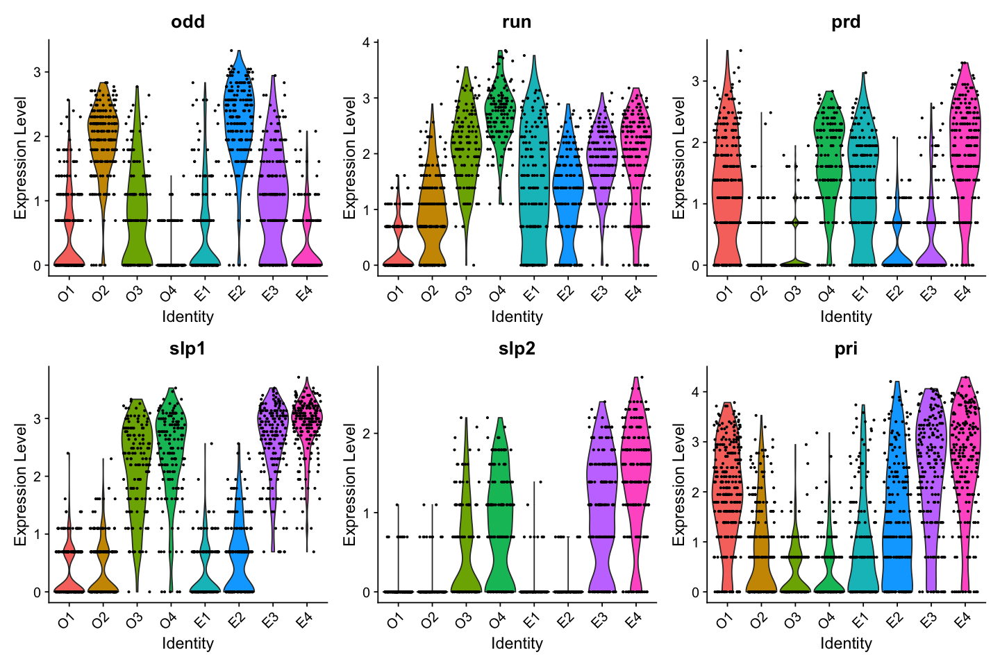

In [127]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect2, features = c("odd", "run", "prd", "slp1", "slp2", "pri"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot3_woPS13.pdf", width = 7.68, height = 5.12)

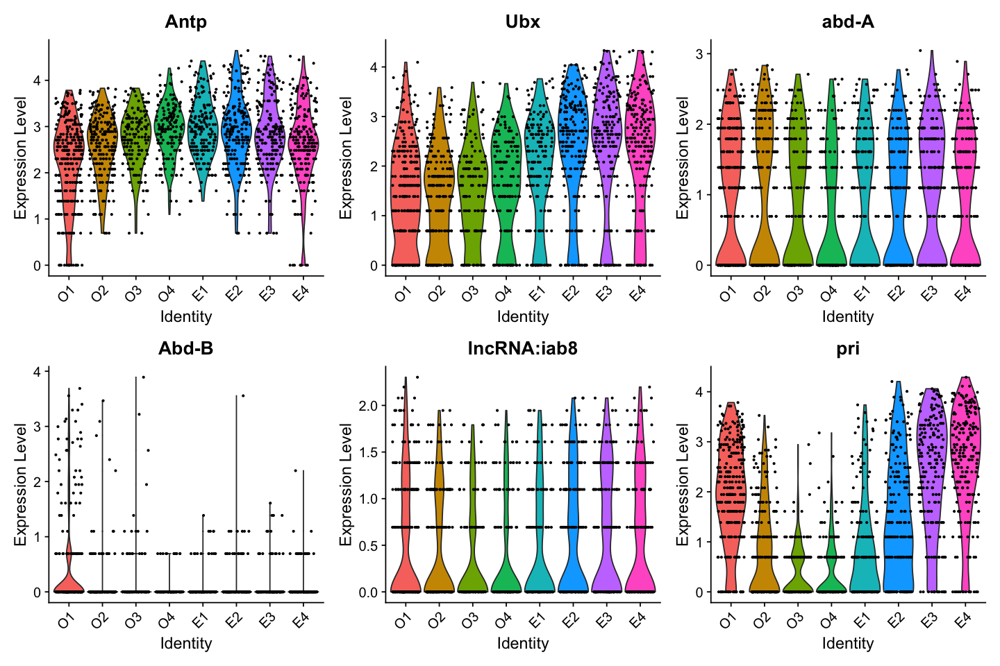

In [128]:

options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect2, features = c("Antp", "Ubx", "abd-A", "Abd-B", "lncRNA:iab8", "pri"),  pt.size = 0.5) 
ggsave(file = "./figures/pair-rule_VlnPlot4_woPS13.pdf", width = 7.68, height = 5.12)

In [129]:
Idents(seu_HQC_lateralect2) <- "manual_ID"

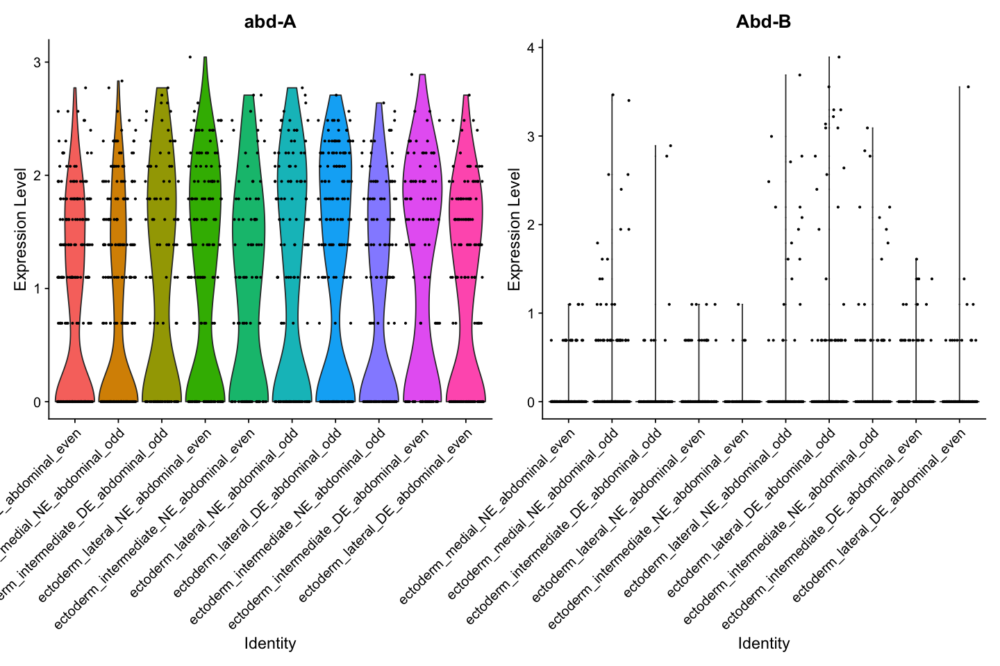

In [130]:

options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect2, features = c("abd-A", "Abd-B"),  pt.size = 0.5) 


In [131]:
Idents(seu_HQC_lateralect2) <- "pairrule_ID"

levels <- c("O1","O2","O3","O4", "E1","E2","E3","E4")
levels(seu_HQC_lateralect2) <- levels

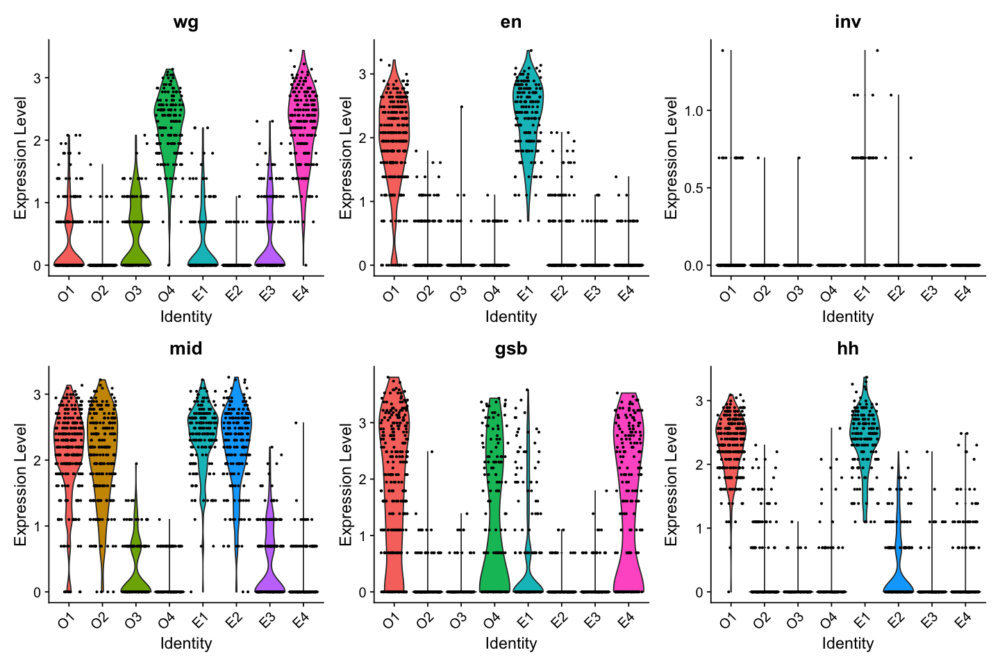

In [132]:
options(repr.plot.width=12, repr.plot.height=8)
VlnPlot(seu_HQC_lateralect2, features = c("wg", "en", "inv", "mid", "gsb", "hh"),  pt.size = 0.5) 


In [133]:
sessionInfo()

R version 4.0.3 (2020-10-10)
Platform: x86_64-apple-darwin17.0 (64-bit)
Running under: macOS Catalina 10.15.7

Matrix products: default
BLAS:   /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRblas.dylib
LAPACK: /Library/Frameworks/R.framework/Versions/4.0/Resources/lib/libRlapack.dylib

locale:
[1] ja_JP.UTF-8/ja_JP.UTF-8/ja_JP.UTF-8/C/ja_JP.UTF-8/ja_JP.UTF-8

attached base packages:
[1] stats     graphics  grDevices utils     datasets  methods   base     

other attached packages:
 [1] viridis_0.5.1     viridisLite_0.3.0 corrr_0.4.3       ClusterR_1.2.2   
 [5] gtools_3.8.2      Rtsne_0.15        tibble_3.0.5      dplyr_1.0.3      
 [9] Matrix_1.3-2      data.table_1.13.6 magrittr_2.0.1    ggplot2_3.3.3    
[13] Seurat_3.2.3     

loaded via a namespace (and not attached):
  [1] colorspace_2.0-0      deldir_0.2-9          ellipsis_0.3.1       
  [4] ggridges_0.5.3        IRdisplay_0.7.0       base64enc_0.1-3      
  [7] spatstat.data_1.7-0   leiden_0.3.6          listen